# Fig 5 panels

In [1]:
import numpy as np
import pandas as pd
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
import colorcet as cc

from tqdm.auto import tqdm
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    PlotConfig,
    save_factory,
)
from copy import deepcopy
from operator import or_
from toolz import reduce, valmap, keyfilter, pluck, dissoc
from aging.behavior.bio_age_model import fit_model, masked_xval, model_fun_v5, get_biological_age, compute_concentrations, concentration_interpolation, create_masks, expected_counts, compute_heldout_r2, model_setup, model_fun_v2
from scipy.spatial.distance import pdist, squareform

In [2]:
format_plots()
c = PlotConfig()
saver = save_factory(c.save_path / "fig-5", tight_layout=False)

In [3]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()


def quantile(n):
    def percentile_(x):
        return x.quantile(n)
    percentile_.__name__ = 'q_{:0.02f}'.format(n)
    return percentile_

In [4]:
to_remove = [
    "e4f1076b",
    "3867c517",
    "60e82cb4",
]

In [5]:
def load_long_df(n_bins: "Optional[int]" = 75):
    keep_syllables = np.loadtxt('/n/groups/datta/win/longtogeny/data/ontogeny/version_11/to_keep_syllables_raw.txt', dtype=int)
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_raw_counts_matrix_v00.parquet"
    )
    df = df[keep_syllables]
    mask = df.index.get_level_values("age") < 100
    df = df[mask].copy()

    masks = []
    for uuid in to_remove:
        m = df.reset_index()['uuid'].str.startswith(uuid)
        masks.append(m)
    mask = np.array(reduce(or_, masks), dtype=bool)
    df = df[~mask].copy()

    size_df = pd.read_parquet(
        '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/longtogeny_males_mouse_area_df_v00.parquet'
    )
    mask = size_df.index.get_level_values("age") < 100
    size_df = size_df[mask].copy()
    age_cut = pd.cut(size_df.index.get_level_values('age'), 19)

    size_df.loc[size_df['quant_0.5'] == 0, 'quant_0.5'] = np.nan
    sizes_col = size_df['quant_0.5']
    sizes_col = sizes_col.groupby('mouse').apply(lambda df: df.sort_index(level='age').interpolate()).droplevel(0)

    sizes_col = zscore(sizes_col.groupby(age_cut, observed=True).transform(demean))
    sizes_col = sizes_col.fillna(0)
    sizes_col = sizes_col.loc[df.index]

    # make sure df matches sizes
    df = df.loc[sizes_col.index]

    if n_bins is not None:
        # subsample the dataset
        cut, bins = pd.cut(df.index.get_level_values('age'), n_bins, retbins=True)
        # tmp_df = df.groupby(['mouse', cut], observed=True).first()
        tmp_df = df.reset_index().groupby(['mouse', cut], observed=True).first().reset_index().drop(columns=['level_1']).set_index(['age', 'mouse', 'subject_name', "session_name", 'uuid', 'date'])
        # mid_age = [round(v.left, 2) for v in tmp_df.index.get_level_values(1)]
        # tmp_df['age'] = mid_age
        # tmp_df = tmp_df.set_index('age', append=True).droplevel(1)

        sizes_col = sizes_col.reset_index().groupby(['mouse', cut], observed=True).first()
        sizes_col = sizes_col.reset_index().drop(columns=['level_1']).set_index(['age', 'mouse', 'subject_name', "session_name", 'uuid', 'date'])
        sizes_col = sizes_col.loc[tmp_df.index, 'quant_0.5']
    else:
        tmp_df = df

    age = jnp.array(tmp_df.index.get_level_values("age"))
    syllable_counts_jax = jnp.array(tmp_df.astype(float))

    label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
    mouse_ids = label_encoder.fit_transform(
        sizes_col.index.get_level_values("mouse").to_numpy()[:, None]
    ).T

    sort_idx = np.argsort(syllable_counts_jax.sum(0))[::-1]

    return tmp_df, syllable_counts_jax, age, sizes_col, mouse_ids, sort_idx

In [6]:
tmp_df, syllable_counts_jax, age, sizes_col, mouse_ids, sort_idx = load_long_df()

In [7]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    # "max_age": 100,
    "max_age": age.max() + 5,
    "age_sd": 9,  # weeks
    "n_age_samples": 504,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [8]:
keep_keys = ['heldout_ll', 'heldout_r2_total_v3', 'true_ages', 'bio_ages']
outs = []

for age_sd in tqdm(np.linspace(1, 20, 20)):
    age_sd = float(age_sd)

    hypparams["age_sd"] = age_sd
    try:
        tmp = masked_xval(features, hypparams, 5, n_repeats=5, disable_tqdm=True)
        tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
        for k, v in tmp.items():
            outs.append({
                "repeat": k,
                "age_sd": age_sd,
                **v
            })
    except ValueError:
        print("Failure:", round(age_sd, 2))
        continue
outs_df = pd.DataFrame(outs)

  0%|          | 0/20 [00:00<?, ?it/s]

In [9]:
optimal_sd = outs_df.groupby('age_sd')['heldout_ll'].mean().idxmax()
optimal_sd

6.0

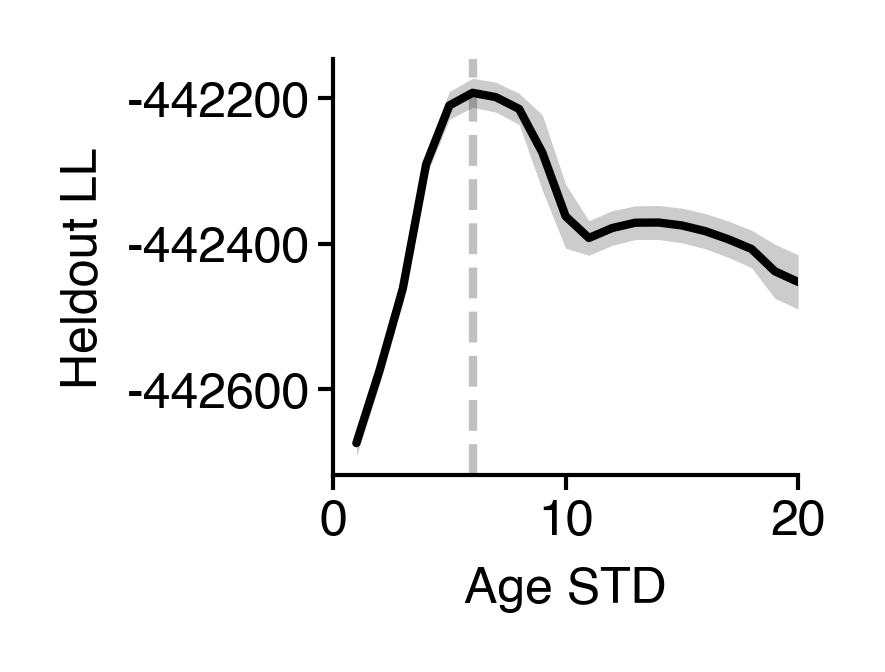

In [10]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=outs_df,
    x="age_sd",
    y="heldout_ll",
    errorbar="se",
    color="k",
    err_kws=dict(lw=0),
)
ax.set(xlabel="Age STD", ylabel="Heldout LL", xlim=(0, 20))
ax.axvline(optimal_sd, ls="--", color="silver", zorder=-1)
sns.despine()
saver(fig, 'longtogeny-age_sd-heldout-ll-lineplot');

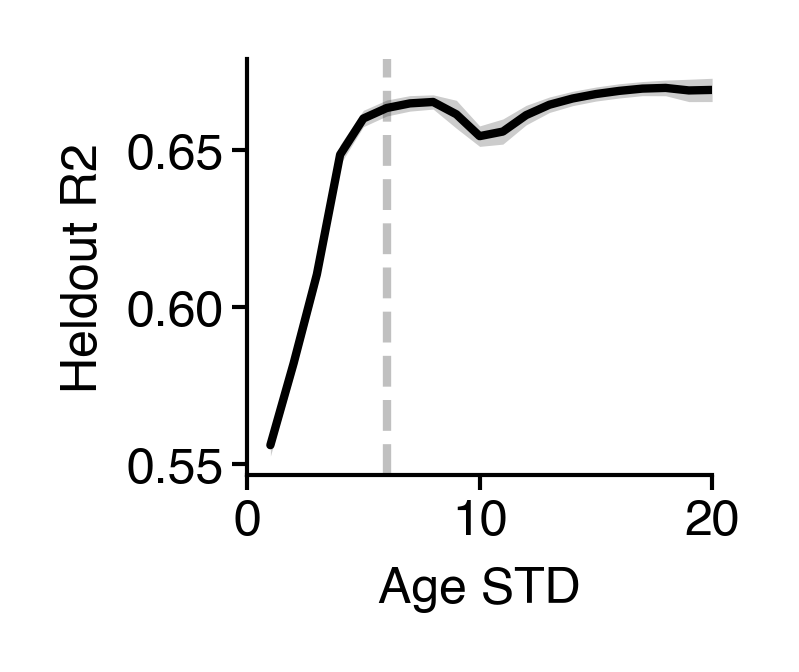

In [11]:
fig = figure(1, 0.9)
ax = sns.lineplot(
    data=outs_df,
    x="age_sd",
    y="heldout_r2_total_v3",
    errorbar="se",
    color="k",
    err_kws=dict(lw=0),
)
ax.set(xlabel="Age STD", ylabel="Heldout R2", xlim=(0, 20))
ax.axvline(optimal_sd, ls="--", color="silver", zorder=-1)
sns.despine()
saver(fig, "longtogeny-age_sd-heldout-r2-lineplot");

## Compare to linear model

In [12]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": optimal_sd,  # weeks
    "n_age_samples": 504,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [13]:
mdl0 = masked_xval(features, hypparams, 0, n_repeats=25)
r2_0 = list(pluck('heldout_r2_total_v3', mdl0.values()))

  0%|          | 0/25 [00:00<?, ?it/s]

In [14]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    # "max_age": 100,
    "max_age": age.max() + 5,
    "age_sd": optimal_sd,  # weeks
    "n_age_samples": 504,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [15]:
mdl5 = masked_xval(features, hypparams, 5, n_repeats=25)
r2_5 = list(pluck('heldout_r2_total_v3', mdl5.values()))

  0%|          | 0/25 [00:00<?, ?it/s]

/tmp/ipykernel_69953/397820012.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(
/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning: 28.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


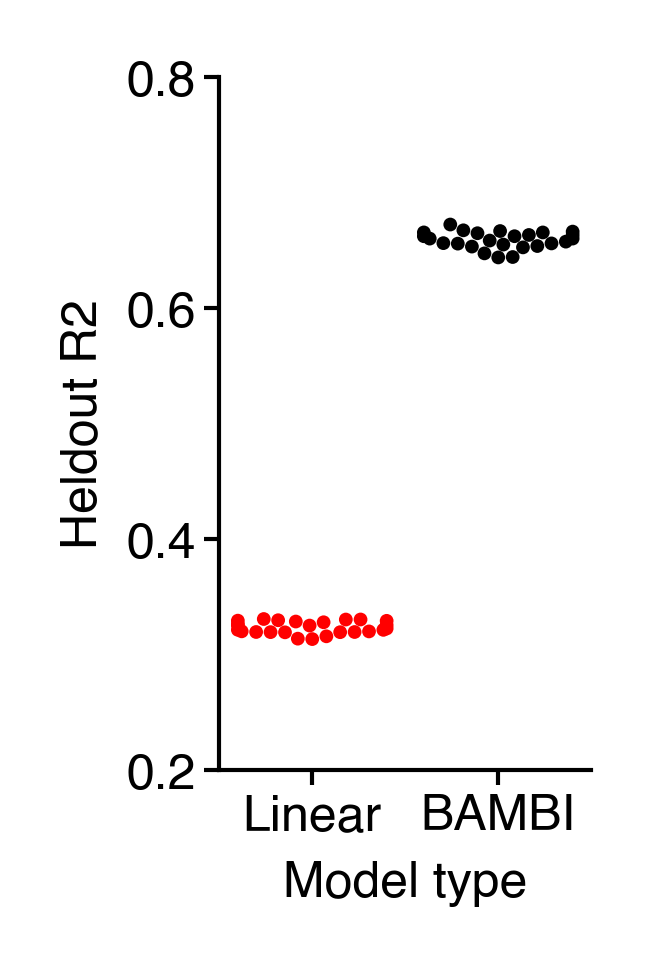

In [16]:
fig = figure(0.8, 1.5)
ax = sns.swarmplot(data=[r2_0, r2_5], palette=["r", "k"], size=1.65)
ax.set(
    xticklabels=["Linear", "BAMBI"],
    xlabel="Model type",
    ylabel="Heldout R2",
    ylim=(0.2, 0.8),
)
sns.despine()
saver(fig, "longtogeny-heldout-r2-model-comparison");

## Visualize syllable count predictions

Supply all the data for this section

In [17]:
tmp_df, syllable_counts_jax, age, sizes_col, mouse_ids, sort_idx = load_long_df()

In [18]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": optimal_sd,  # weeks
    "n_age_samples": 504,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [19]:
mdl = fit_model(features, hypparams, 5)

In [20]:
labels = LabelEncoder().fit_transform(tmp_df.index.get_level_values('mouse'))

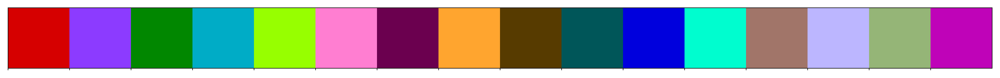

In [21]:
sns.palplot(cc.glasbey[:16])

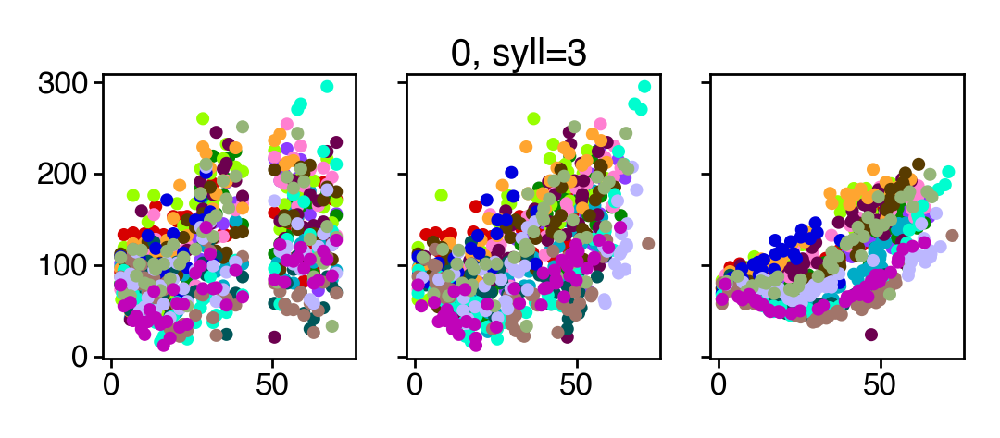

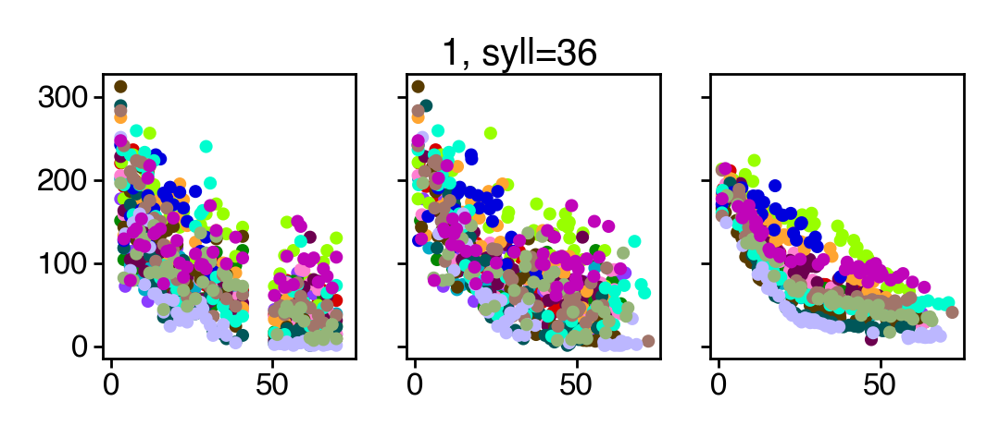

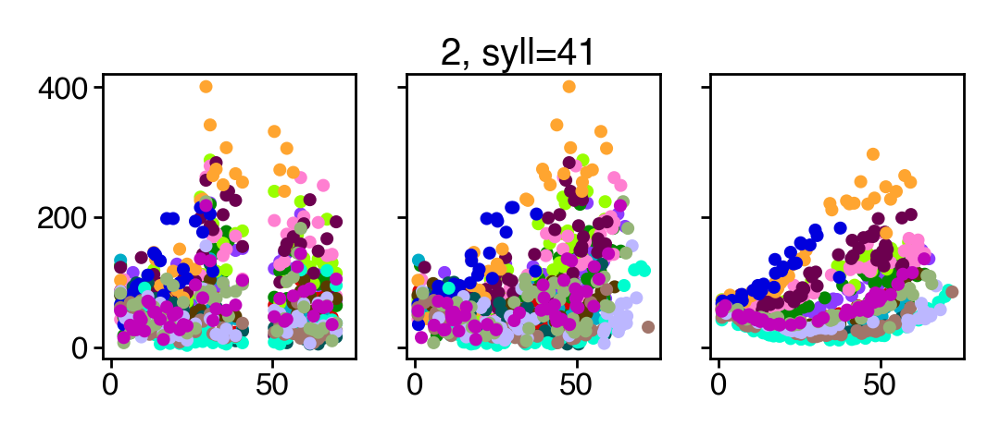

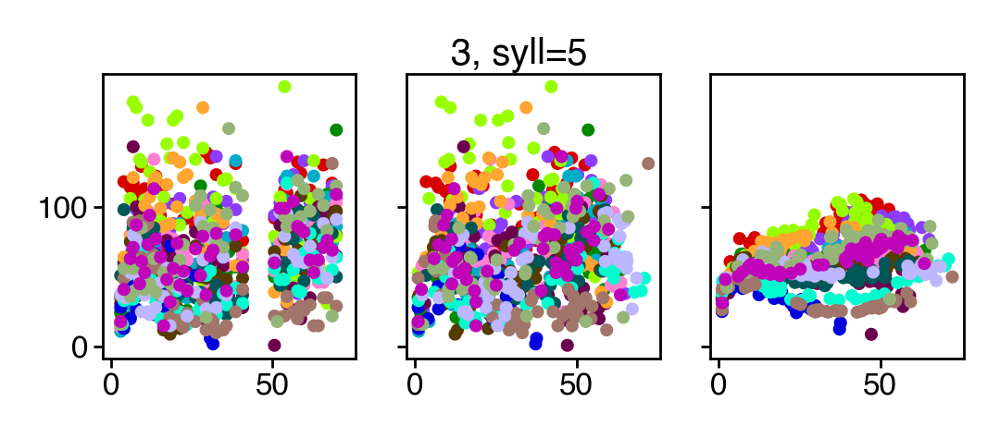

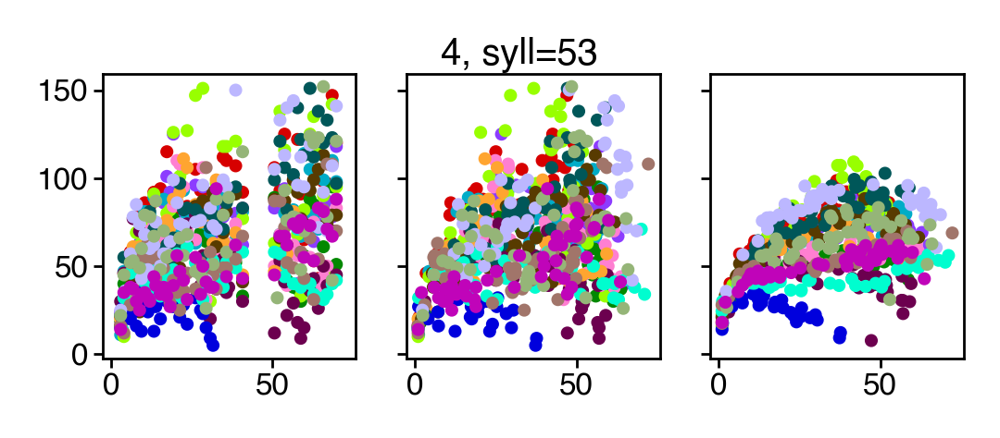

...

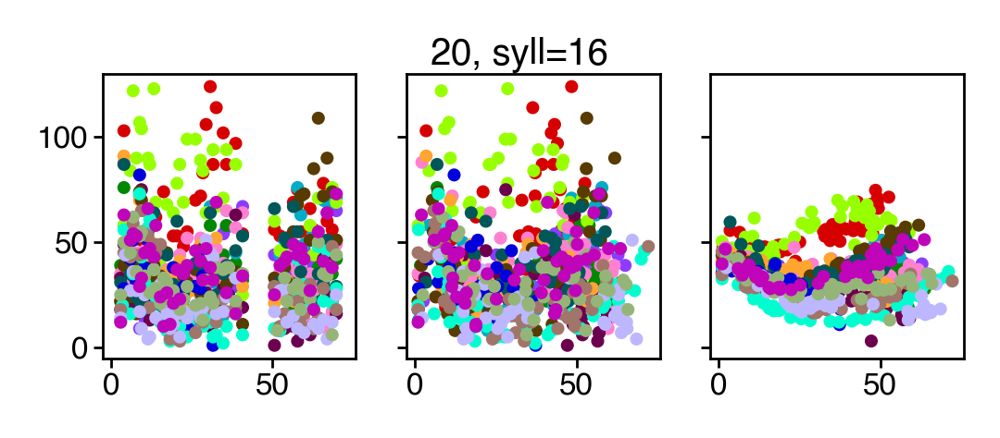

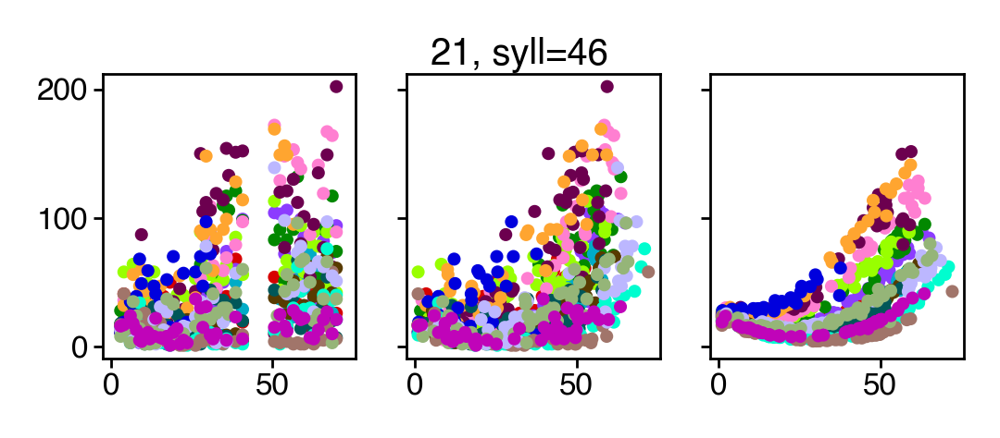

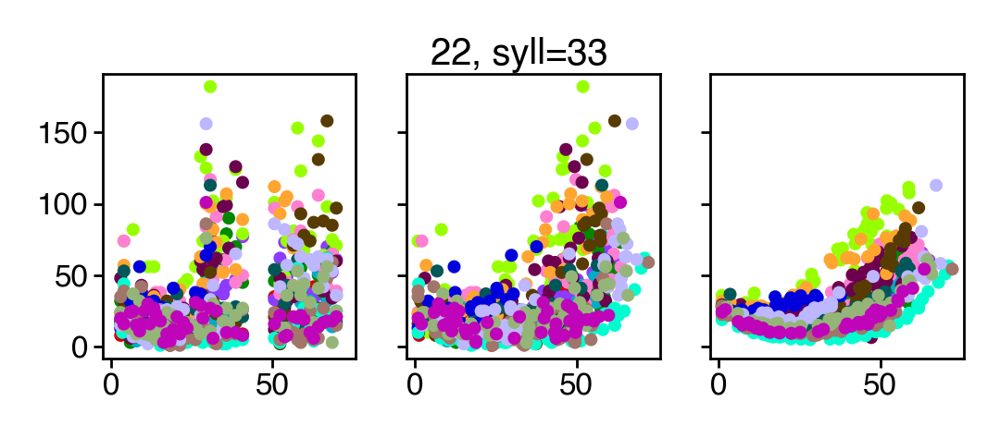

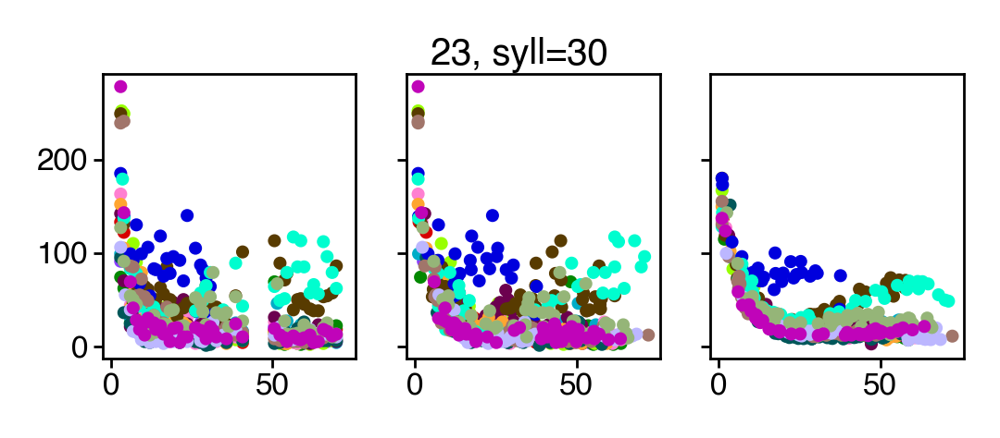

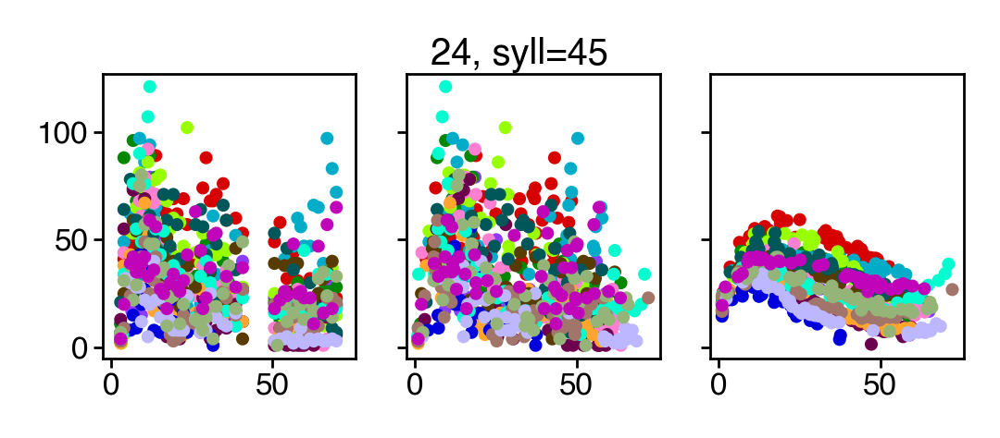

In [22]:
for i, syll in enumerate(map(lambda i: sort_idx[i], range(25))):
    fig, ax = plt.subplots(1, 3, figsize=(3, 1), sharey=True, sharex=True)
    fig.suptitle(f"{i}, syll={syll}")
    ax[0].scatter(mdl['true_ages'], mdl['counts'][:, syll], s=3, c=labels, cmap=cc.cm.glasbey, vmax=256)
    ax[1].scatter(mdl['bio_ages'], mdl['counts'][:, syll], s=3, c=labels, cmap=cc.cm.glasbey, vmax=256)
    ax[2].scatter(mdl['bio_ages'], mdl['predicted_counts'][:, syll], s=3, c=labels, cmap=cc.cm.glasbey, vmax=256)

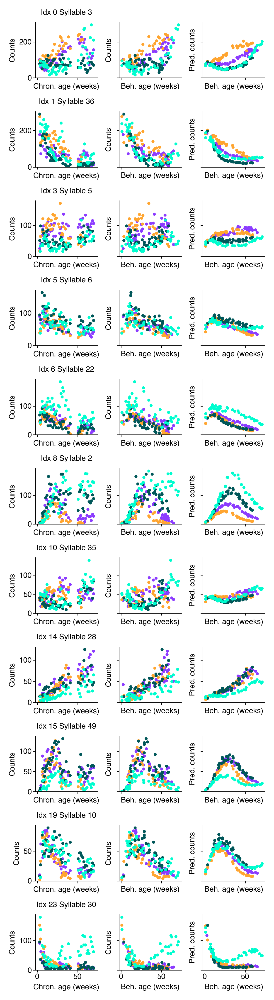

In [23]:
example_mice = [11, 7, 9, 1]

mask = []
for m in example_mice:
    mask.append(labels == m)
mask = reduce(or_, mask)

sylls = [0, 1, 3, 5, 6, 8, 10, 14, 15, 19, 23]
fig, ax = plt.subplots(len(sylls), 3, figsize=(3, len(sylls)), sharex=True)

true_age = mdl["true_ages"][mask]
bio_age = mdl["bio_ages"][mask]
counts = mdl["counts"][mask]
pred_counts = mdl["predicted_counts"][mask]

for a, syll, i in zip(ax, map(lambda i: sort_idx[i], sylls), sylls):
    max_counts = max([counts[:, syll].max(), pred_counts[:, syll].max()]) * 1.05
    a[0].scatter(true_age, counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[0].set(title=f"Idx {i} Syllable {syll}", ylabel="Counts", xlabel="Chron. age (weeks)", ylim=(0, max_counts))

    a[2].scatter(bio_age, pred_counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[2].set(ylabel="Pred. counts", xlabel="Beh. age (weeks)", ylim=(0, max_counts), yticklabels=[])

    a[1].scatter(bio_age, counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[1].set(ylabel="Counts", xlabel="Beh. age (weeks)", ylim=(0, max_counts), yticklabels=[])
sns.despine()
fig.tight_layout()
saver(fig, "longtogeny-true-vs-predicted-counts");

## Create age plot

In [24]:
def make_plot(age_df, width, height, hue_order=None):
    boundaries = np.arange(age_df["labels"].max() + 2) - 0.5
    fig = figure(width, height)
    if hue_order is None:
        pal = cc.glasbey[: age_df["labels"].max() + 1]
    else:
        pal = [cc.glasbey[hue] for hue in hue_order]
    ax = sns.lineplot(
        data=age_df,
        x="true_ages",
        y="bio_ages",
        hue="labels",
        palette=pal,
        hue_order=hue_order,
        legend=False,
        zorder=-1,
        lw=0.25,
    )
    if hue_order is not None:
        age_df = age_df[age_df['labels'].isin(hue_order)]
    im = ax.scatter(
        age_df["true_ages"],
        age_df["bio_ages"],
        c=age_df["labels"],
        cmap=cc.cm.glasbey,
        vmin=0,
        vmax=256,
        s=2.5,
    )
    cb = fig.colorbar(
        mappable=im,
        boundaries=boundaries,
        ax=ax,
        label="Mouse ID",
    )
    cb.set_ticks(range(0, 16, 2))
    add_identity(ax, c="k", ls="--", zorder=-2)
    ax.set(
        xlabel="Chronological age (weeks)",
        ylabel="Behavioral age (weeks)",
        aspect="equal",
        ylim=(0, 72),
        xlim=(0, 72),
    )
    sns.despine()
    return fig

In [25]:
age_df = pd.DataFrame(
    dict(bio_ages=mdl["bio_ages"], true_ages=mdl["true_ages"], labels=labels),
)

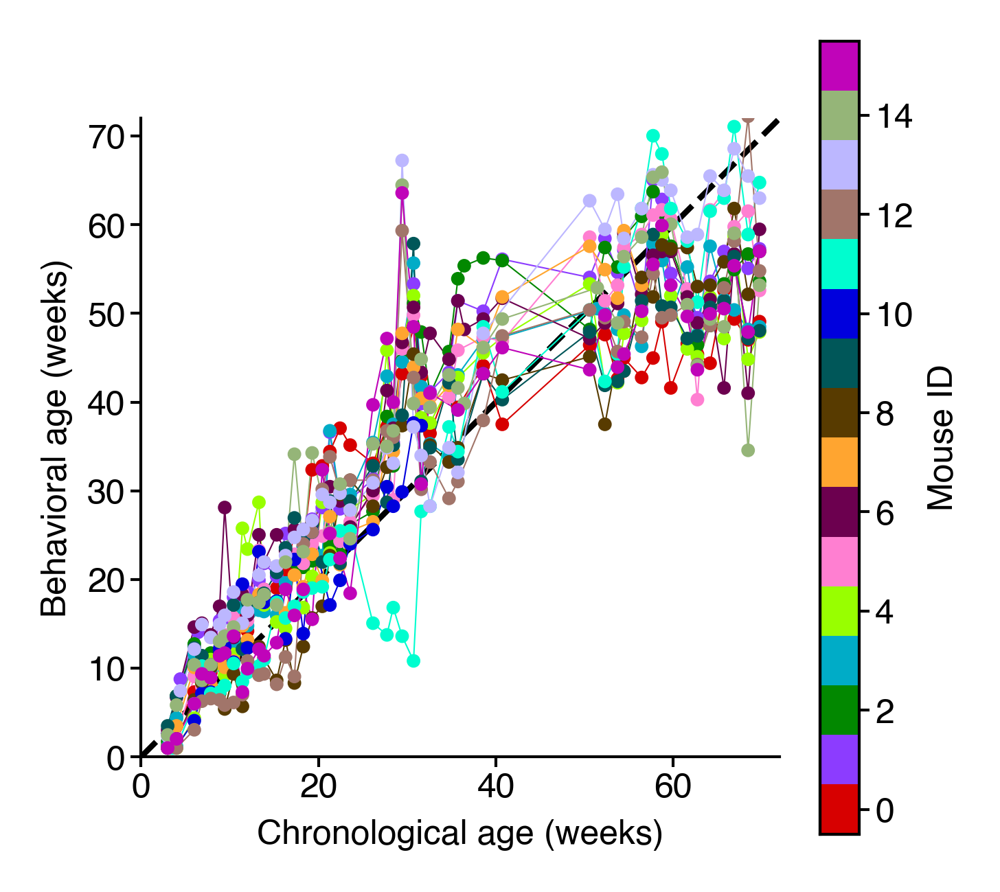

In [26]:
fig = make_plot(age_df, 2.5, 2.5)
saver(fig, "longtogeny-chron-vs-beh-age");

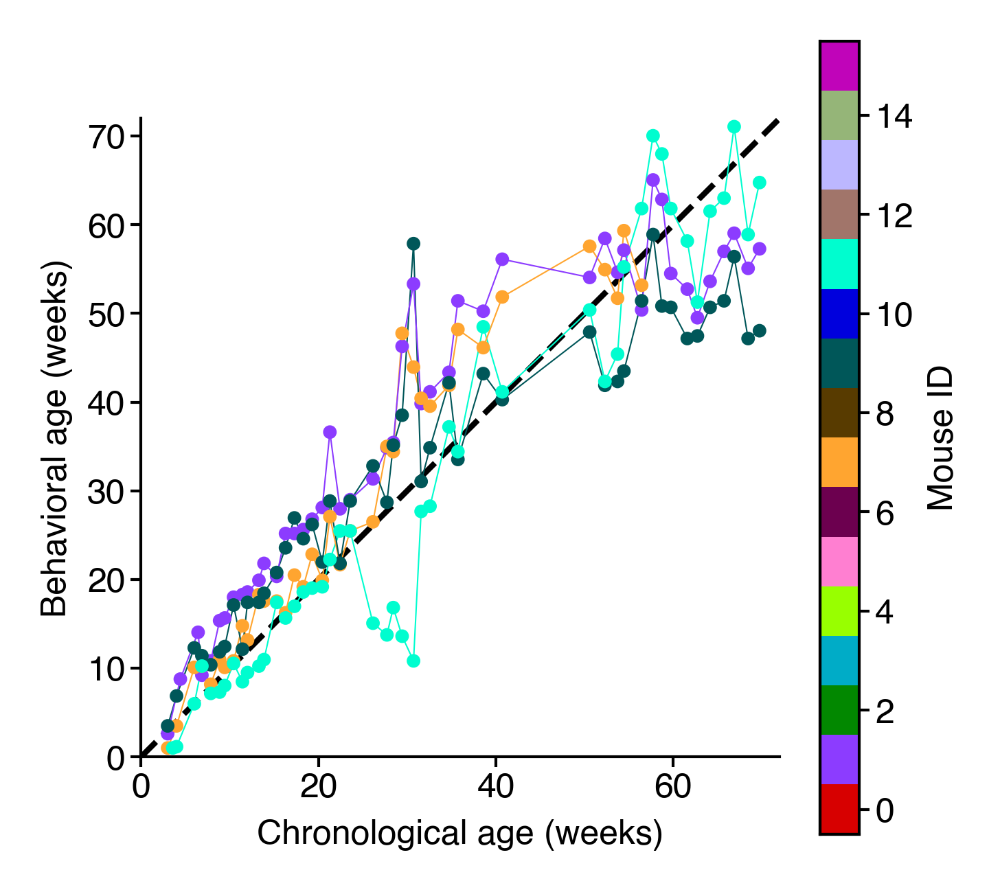

In [27]:
fig = make_plot(age_df, 2.5, 2.5, hue_order=example_mice)
saver(fig, "longtogeny-chron-vs-beh-age-examples");

## Re-sorted behavioral distance matrices

In [28]:
from scipy.spatial.distance import pdist, squareform

In [29]:
tmp_df, syllable_counts_jax, age, sizes_col, mouse_ids, sort_idx = load_long_df()

In [30]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": optimal_sd,  # weeks
    "n_age_samples": 504,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [31]:
mdl = fit_model(features, hypparams, 5)

In [32]:
df_copy = tmp_df.copy()
df_copy['beh_age'] = mdl['bio_ages']
df_copy = df_copy.set_index('beh_age', append=True)
# df_copy.to_parquet('/n/scratch/users/w/wg41/bio-age-model/longtogeny-behavioral-age.parquet')
df_copy.to_parquet('/n/scratch/users/w/wg41/bio-age-model/longtogeny-behavioral-age-subset.parquet')

Text(0, 0.5, 'Session (sorted by chron. age)')

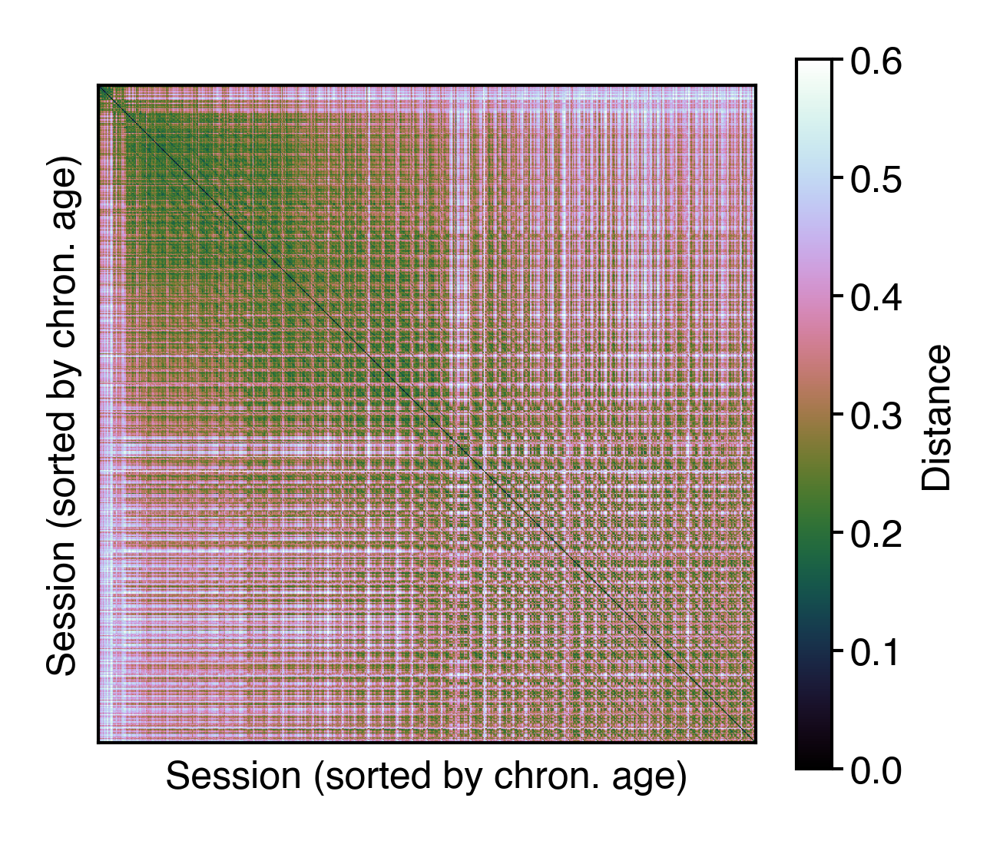

In [33]:
fig = figure(2.3, 2)
d = pdist(tmp_df.sort_index(level='age'), metric='jensenshannon')
d = squareform(d)
plt.imshow(d, cmap='cubehelix', vmax=0.6)
plt.colorbar(label="Distance")
plt.xticks([])
plt.yticks([])
plt.xlabel('Session (sorted by chron. age)')
plt.ylabel('Session (sorted by chron. age)')
# saver(fig, 'longtogeny-chron-age-distance-matrix');

Text(0, 0.5, 'Session (sorted by beh. age)')

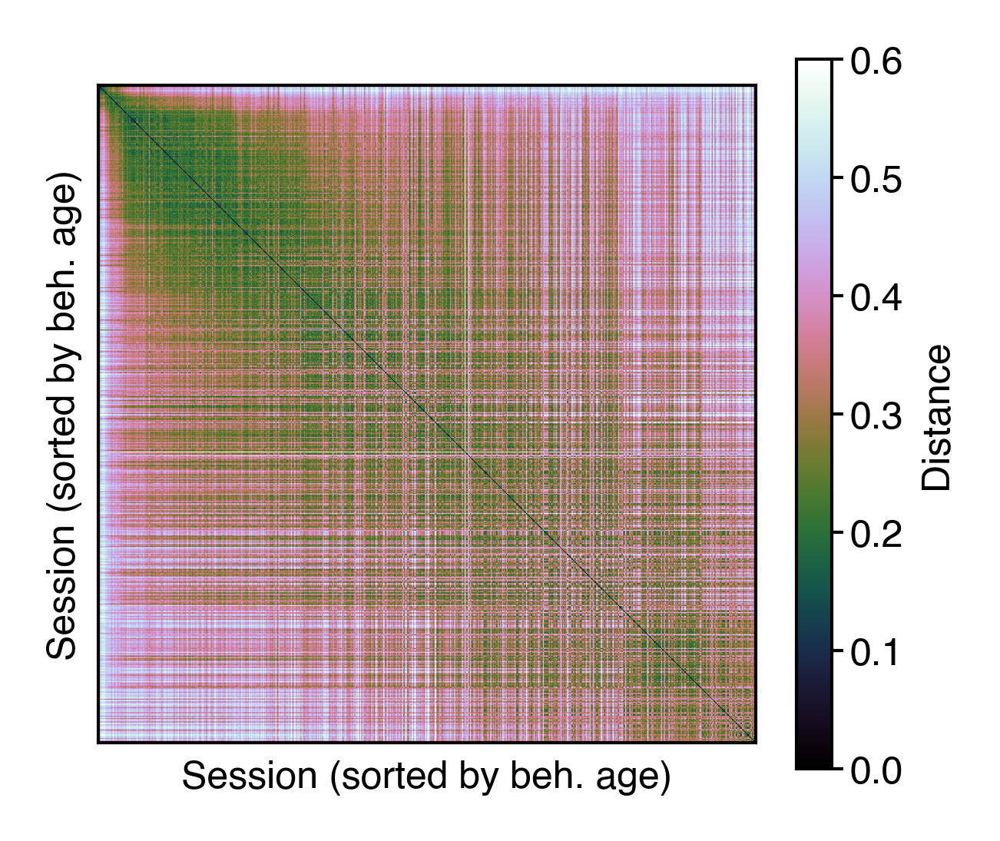

In [34]:
fig = figure(2.3, 2)
d = pdist(df_copy.sort_index(level='beh_age'), metric='jensenshannon')
d = squareform(d)
plt.imshow(d, cmap='cubehelix', vmax=0.6)
plt.colorbar(label="Distance")
plt.xticks([])
plt.yticks([])
plt.xlabel('Session (sorted by beh. age)')
plt.ylabel('Session (sorted by beh. age)')
# saver(fig, 'longtogeny-beh-age-distance-matrix');

## Development component

In [35]:
list(mdl['params'])

['bio_basis_weights', 'development_weights', 'individual_biases', 'size_slope']

In [36]:
x = mdl['params']['development_weights']
dev = (x @ mdl['init_components'].bases['development']).squeeze()

In [37]:
comps = mdl['init_components']

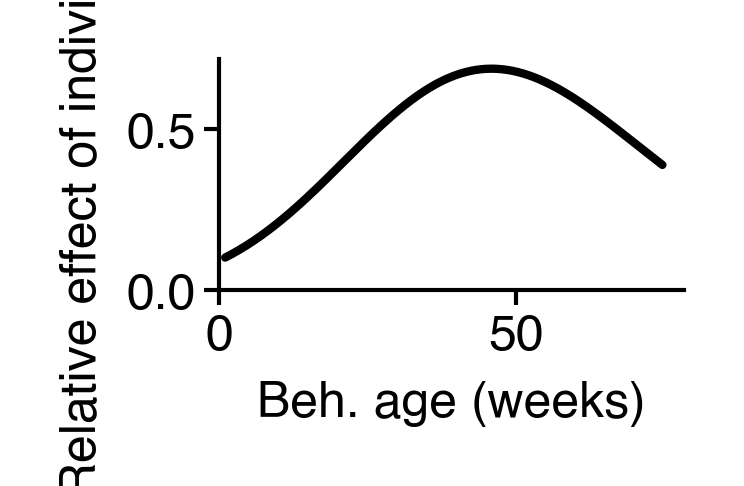

In [38]:
dev = np.exp(dev)

fig = figure(1, 0.5)
plt.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, None)
plt.ylim(0, None)
plt.xlabel("Beh. age (weeks)")
plt.ylabel("Relative effect of individuality")
sns.despine()
saver(fig, "longtogeny-effect-of-individuality");

## Relative influences

In [39]:
tmp_df, syllable_counts_jax, age, sizes_col, mouse_ids, sort_idx = load_long_df()

In [40]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
    "mice": mouse_ids,  # models > 2
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": float(optimal_sd),  # weeks
    "n_age_samples": 504,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [41]:
mdl = fit_model(features, hypparams, 5)

In [42]:
conc_c = mdl['concentration_components']
indiv_components = conc_c['indiv'] * conc_c['indiv_scale'][None, :, None]

total = (
    np.abs(conc_c["bio"][..., None])
    + np.abs(indiv_components)
    + np.abs(conc_c["size"][:, None, :])
)

In [43]:
init_c = mdl["init_components"]
log_probs = model_fun_v5(
    mdl["params"],
    init_c.bases,
    init_c.age_samples,
    init_c.true_age,
    features["counts"],
    dissoc(hypparams, "mask"),
)
inds = np.array(np.argmax(log_probs, axis=1))

In [44]:
bio = np.abs(conc_c['bio'][..., None]) / total
indiv = np.abs(indiv_components) / total
size = np.abs(conc_c['size'][:, None, :]) / total

In [45]:
bio = bio[:, inds, np.arange(len(inds))]
indiv = indiv[:, inds, np.arange(len(inds))]
size = size[:, inds, np.arange(len(inds))]

In [61]:
bio_df = pd.DataFrame(bio.T, index=tmp_df.index).reset_index()
bio_df["bio_age"] = mdl["bio_ages"]
bio_df = bio_df.drop(columns=['subject_name', 'session_name', 'uuid', 'date']).melt(
    id_vars=["mouse", "age", "bio_age"], var_name="syllable", value_name="influence"
)
bio_df["type"] = "Beh. age"

size_df = pd.DataFrame(size.T, index=tmp_df.index).reset_index()
size_df["bio_age"] = mdl["bio_ages"]
size_df = size_df.drop(columns=['subject_name', 'session_name', 'uuid', 'date']).melt(
    id_vars=["mouse", "age", "bio_age"], var_name="syllable", value_name="influence"
)
size_df["type"] = "Size"

indiv_df = pd.DataFrame(indiv.T, index=tmp_df.index).reset_index()
indiv_df["bio_age"] = mdl["bio_ages"]
indiv_df = indiv_df.drop(columns=['subject_name', 'session_name', 'uuid', 'date']).melt(
    id_vars=["mouse", "age", "bio_age"], var_name="syllable", value_name="influence"
)
indiv_df["type"] = "Identity"

In [62]:
plt_dfs = pd.concat([bio_df, size_df, indiv_df])
plt_dfs['bio_bin'] = pd.cut(plt_dfs['bio_age'], 35)
plt_dfs['bio_bin'] = plt_dfs['bio_bin'].map(lambda x: x.mid)
plt_dfs['age_bin'] = pd.cut(plt_dfs['age'], 35)
plt_dfs['age_bin'] = plt_dfs['age_bin'].map(lambda x: x.mid)

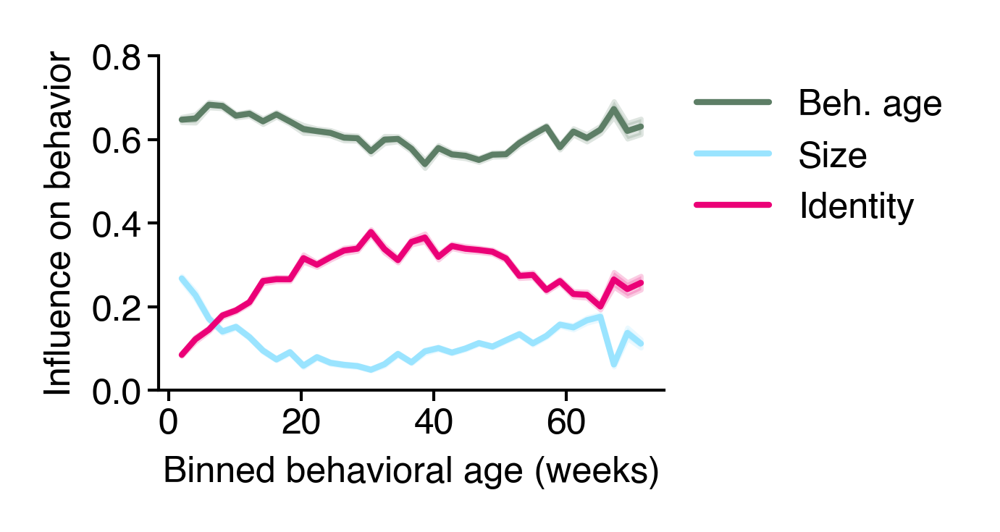

In [64]:
fig = figure(1.5, 1)
ax = sns.lineplot(data=plt_dfs, x='bio_bin', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Binned behavioral age (weeks)", ylabel="Influence on behavior", ylim=(0, 0.8))
legend()
sns.despine()
saver(fig, 'longtogeny-component-influence-on-behavior');

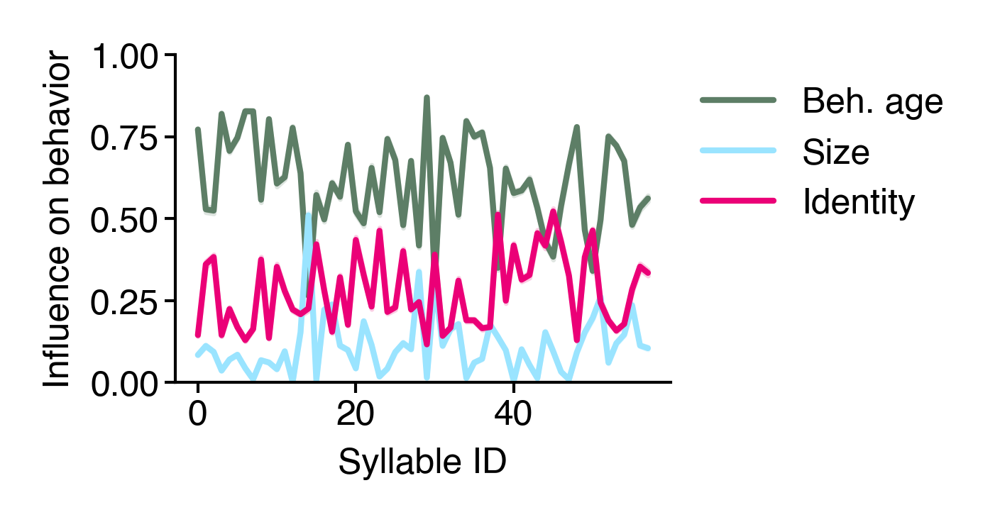

In [65]:
fig = figure(1.5, 1)
ax = sns.lineplot(data=plt_dfs, x='syllable', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Syllable ID", ylabel="Influence on behavior", ylim=(0, 1))
legend()
sns.despine()
saver(fig, 'longtogeny-syllables-component-influence-on-behavior');

In [66]:
x = pd.pivot_table(
    plt_dfs.groupby(["syllable", "type"])["influence"].mean().reset_index(),
    index="syllable",
    columns="type",
    values="influence",
)
remapping = dict(
    map(reversed, enumerate(x.sort_values(by="Beh. age", ascending=False).index))
)

In [67]:
plt_dfs.head()

,mouse,age,bio_age,syllable,influence,type,bio_bin,age_bin
0,01_01,3.000000,1.293099,0,0.718837,Beh. age,1.9820,3.9195
1,01_01,4.000000,3.491338,0,0.754891,Beh. age,4.0525,3.9195
2,01_01,6.000000,7.301619,0,0.790766,Beh. age,8.1225,5.8590
3,01_01,6.857143,6.422324,0,0.816306,Beh. age,6.0875,7.7650
4,01_01,7.857143,9.499858,0,0.817200,Beh. age,10.1575,7.7650


In [68]:
plt_dfs['sorted_syllable'] = plt_dfs['syllable'].map(remapping)

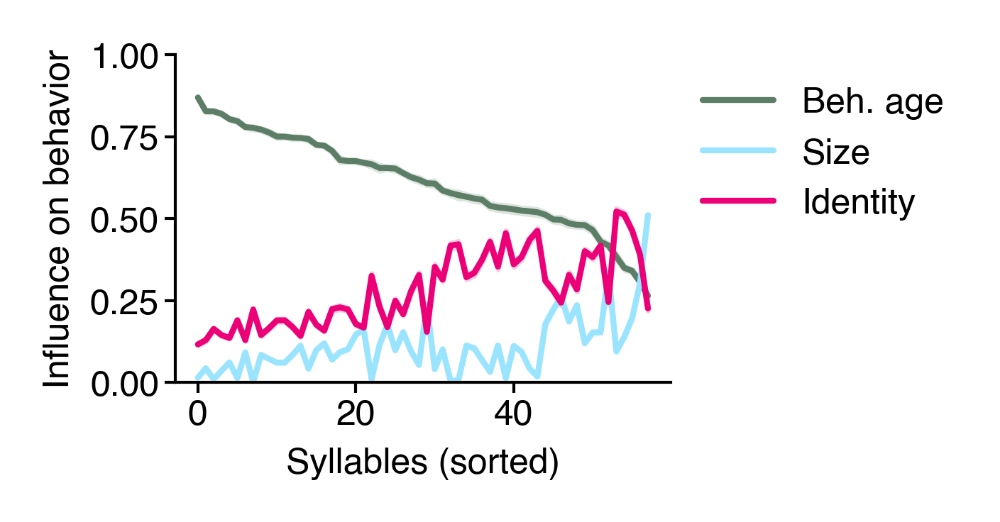

In [69]:
fig = figure(1.5, 1)
ax = sns.lineplot(data=plt_dfs, x='sorted_syllable', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:27])
ax.set(xlabel="Syllables (sorted)", ylabel="Influence on behavior", ylim=(0, 1))
legend()
sns.despine()
saver(fig, 'longtogeny-syllables-component-influence-on-behavior-sorted');

In [70]:
# rank-order influences
tmp = plt_dfs.groupby(['syllable', 'type'])[['influence']].mean()
ranks = tmp.groupby('type').rank().reset_index()

In [71]:
mp = ranks.query('type == "Identity"').set_index('syllable')['influence']

In [72]:
ranks['color'] = ranks['syllable'].map(mp)

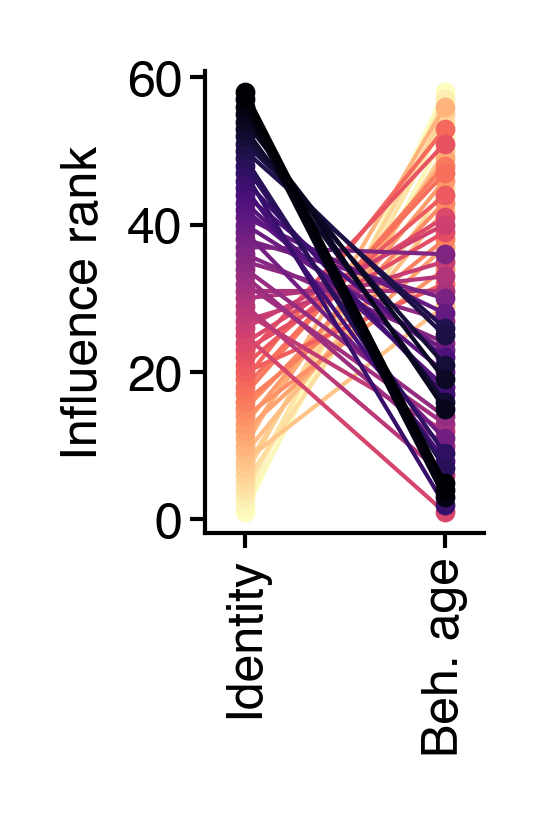

In [73]:
# NOTE: I don't think this plot is useful any more - this is a necessary outcome of looking at relative influence
fig = figure(0.6, 1)
ax = sns.pointplot(
    data=ranks,
    x="type",
    y="influence",
    hue="color",
    palette="magma_r",
    order=["Identity", "Beh. age"],
    legend=False,
    markersize=2,
    linewidth=0.5
)
ax.set(xlabel="", xlim=(-0.2, 1.2), ylabel="Influence rank")
plt.xticks(rotation=90)
sns.despine()
saver(fig, "longtogeny-rank-order-influence");

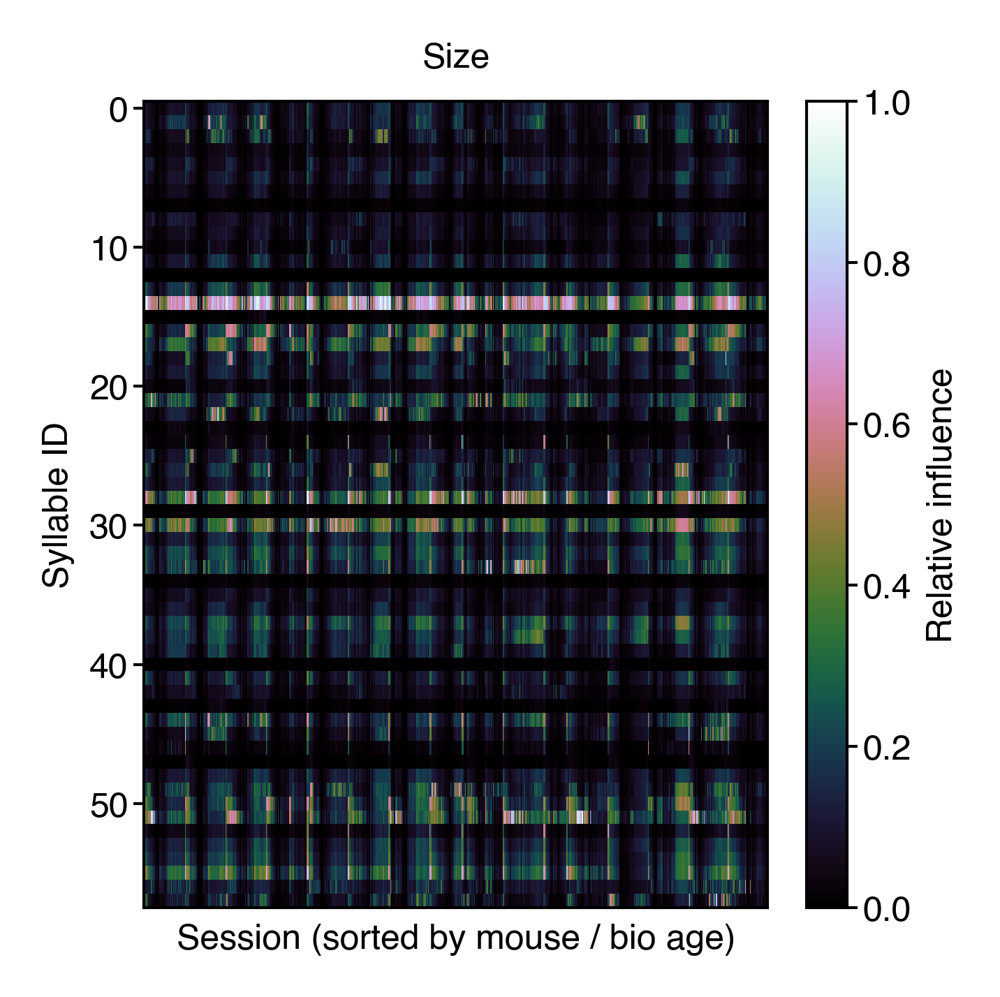

In [74]:
fig = figure(2.4, 2.5)
plt.imshow(size, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Size")
plt.xlabel("Session (sorted by mouse / bio age)")
saver(fig, "longtogeny-size-influence-matrix");

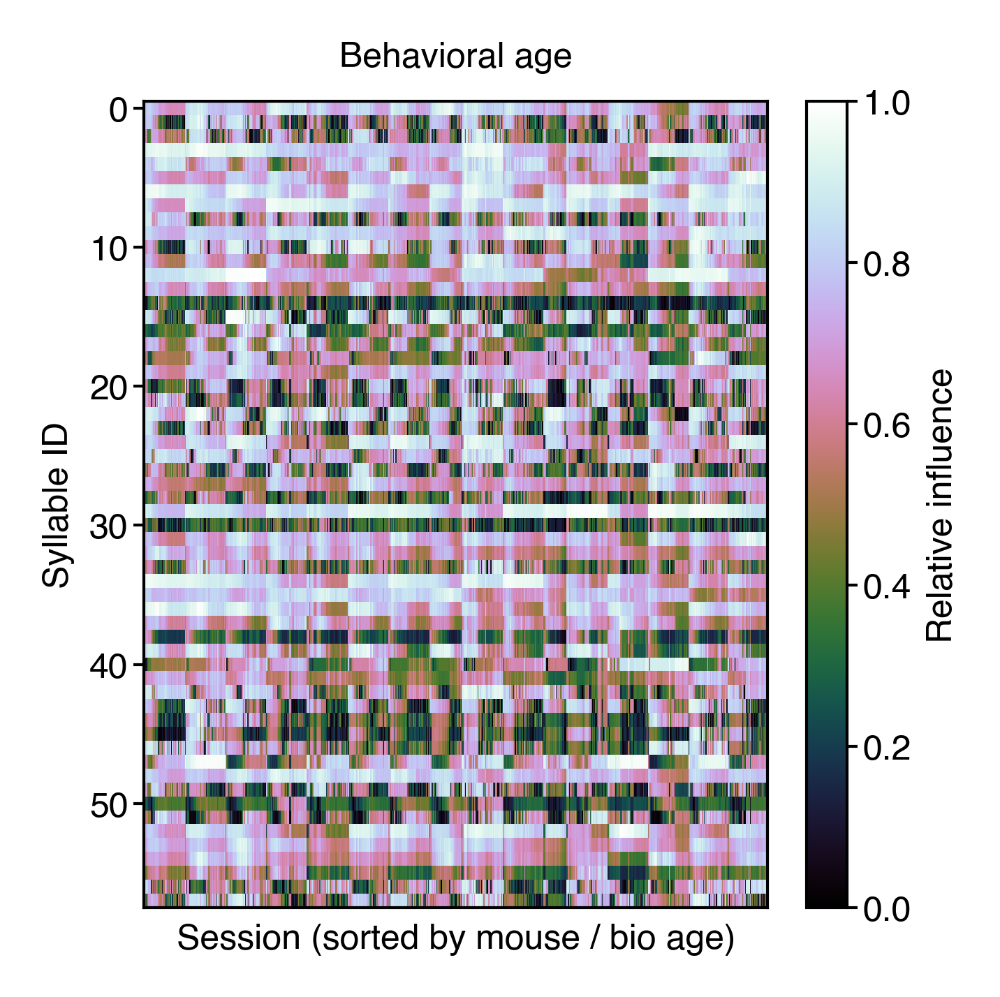

In [75]:
fig = figure(2.4, 2.5)
plt.imshow(bio, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Behavioral age")
plt.xlabel("Session (sorted by mouse / bio age)")
saver(fig, "longtogeny-beh-age-influence-matrix");

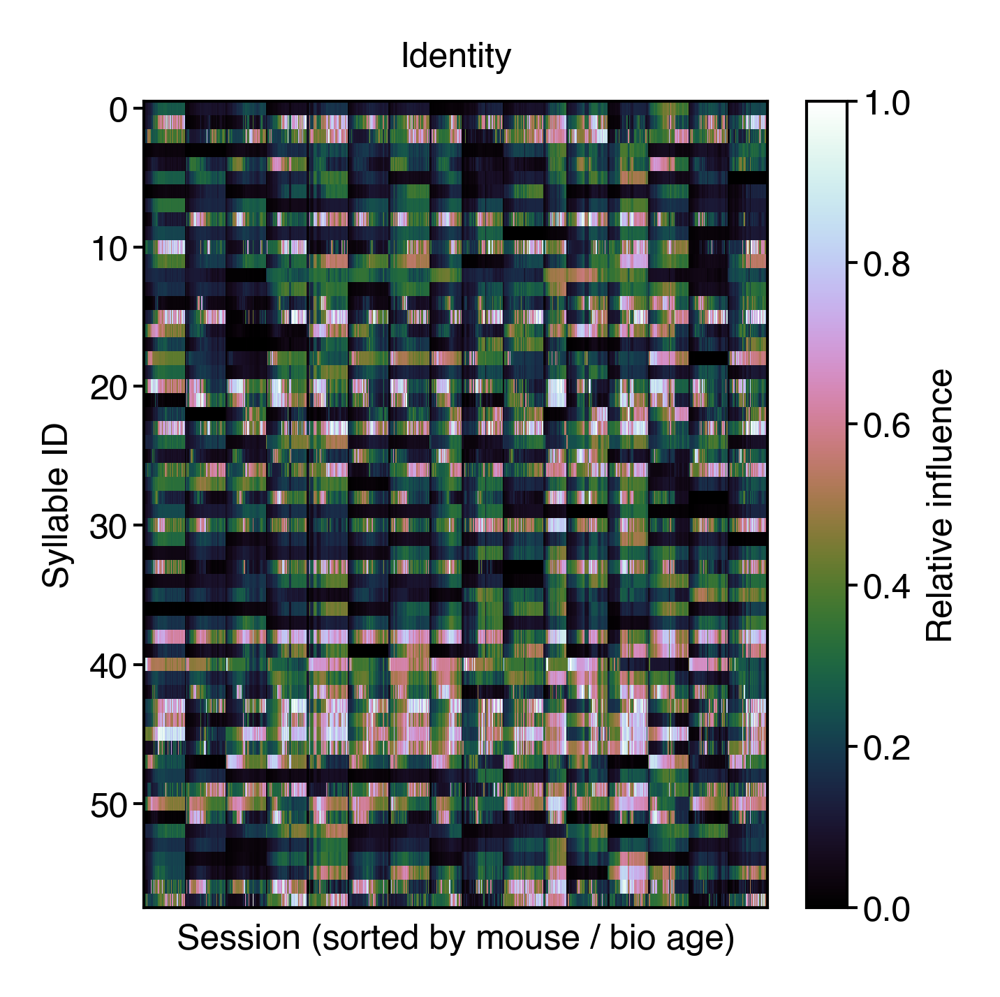

In [76]:
fig = figure(2.4, 2.5)
plt.imshow(indiv, aspect='auto', interpolation='none', vmin=0, vmax=1, cmap='cubehelix')
plt.colorbar(label="Relative influence")
plt.xticks([])
plt.ylabel("Syllable ID")
plt.title("Identity")
plt.xlabel("Session (sorted by mouse / bio age)")
saver(fig, "longtogeny-indiv-influence-matrix");

## Ontogeny male vs female

In [77]:
keep_syllables = np.loadtxt('/n/groups/datta/win/longtogeny/data/ontogeny/version_11/to_keep_syllables_raw.txt', dtype=int)

In [78]:
def read_female_ontogeny(use_syllables):
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_females_raw_counts_matrix_v00.parquet"
    )
    df = df[use_syllables]
    df = df.query('age < 100')

    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_females_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)

    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]

    df = df[use_syllables]
    return df, sizes_col

In [79]:
def read_male_ontogeny(use_syllables):
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_raw_counts_matrix_v00.parquet"
    )
    df = df[use_syllables]
    df = df.query('age < 100')

    pth = '/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet'
    size_df = pd.read_parquet(pth)

    sizes_col = zscore(size_df.groupby('age')['quant_0.5'].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]
    df = df[use_syllables]
    return df, sizes_col

In [82]:
df, sizes_col = read_male_ontogeny(keep_syllables)
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

In [83]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": 9,  # weeks
    "n_age_samples": 630,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [84]:
keep_keys = ['heldout_ll', 'heldout_r2_total', 'heldout_r2_total_v3', 'true_ages', 'bio_ages']

In [85]:
outs = []

for age_sd in tqdm(range(1, 20, 1)):

    hypparams["age_sd"] = float(age_sd)

    tmp = masked_xval(features, hypparams, 2, n_repeats=5, disable_tqdm=True)
    tmp = valmap(lambda v: keyfilter(lambda k: k in keep_keys, v), tmp)
    for k, v in tmp.items():
        outs.append({
            "repeat": k,
            "age_sd": age_sd,
            **v
        })
outs_df = pd.DataFrame(outs)

  0%|          | 0/19 [00:00<?, ?it/s]

In [86]:
optimal_age_sd = outs_df.groupby('age_sd')['heldout_ll'].mean().idxmax()

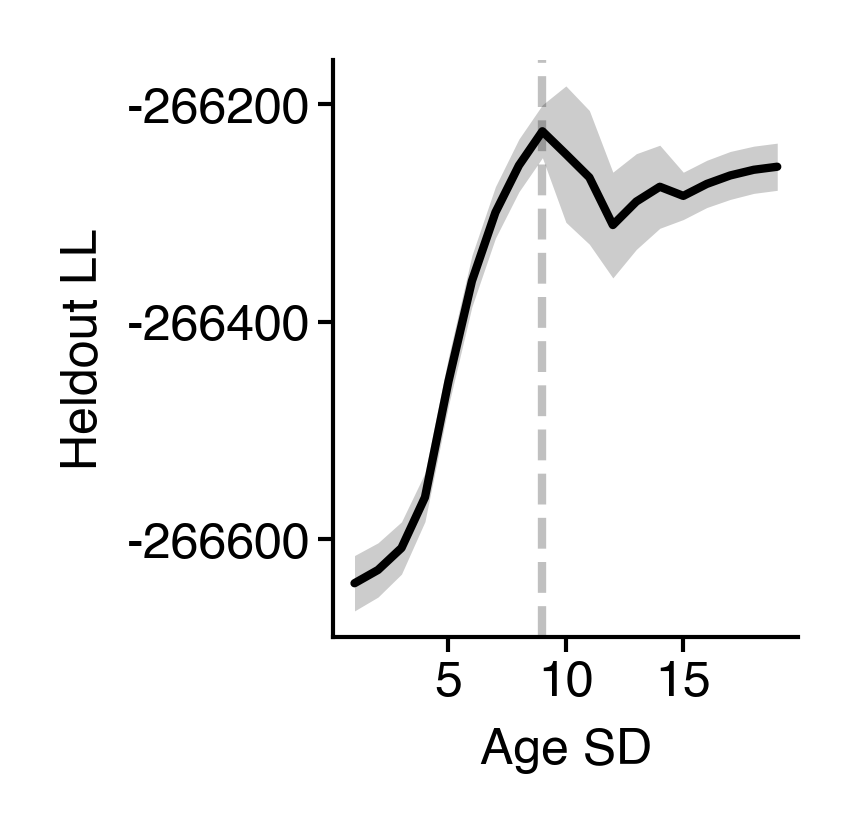

In [87]:
figure(1, 1.25)
ax = sns.lineplot(
    data=outs_df,
    x="age_sd",
    y="heldout_ll",
    errorbar="se",
    err_kws=dict(lw=0),
    color="k",
)
ax.set(ylabel="Heldout LL", xlabel="Age SD")
ax.axvline(optimal_age_sd, ls='--', color='silver', zorder=-1)
sns.despine()

## Fit to males, apply to females

In [88]:
df, sizes_col = read_male_ontogeny(keep_syllables)
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

In [89]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": optimal_age_sd,  # weeks
    "n_age_samples": 630,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [90]:
males = masked_xval(features, hypparams, 2, n_repeats=20)

  0%|          | 0/20 [00:00<?, ?it/s]

In [91]:
bio_age_samples = [pd.Series(v['bio_ages'], index=df.index) for v in males.values()]
bio_age_samples = pd.DataFrame(bio_age_samples).T
bio_age_samples.to_parquet('/n/scratch/users/w/wg41/bio-age-model/ontogeny-predictions.parquet')

In [92]:
df, sizes_col = read_female_ontogeny(keep_syllables)
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

In [93]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": float(optimal_age_sd),  # weeks
    "n_age_samples": 630,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [94]:
def process_heldout_data(params, components, features, hypparams, model_version=2, rng=None):
    if rng is None:
        rng = np.random.RandomState(3)
    bio_ages, _ = get_biological_age(
        params,
        components.bases,
        components.age_samples,
        components.true_age,
        features["counts"],
        hypparams,
        components.age_unnormalizer,
        globals()[f'model_fun_v{model_version}'],
    )
    concentrations, concentration_components = compute_concentrations(params, model_version, components, hypparams)

    norm_bio_age = components.age_normalizer(bio_ages)

    concs = []
    for i in range(len(norm_bio_age)):
        idx = i if len(concentrations) > 1 else 0
        _concs = concentration_interpolation(norm_bio_age[idx], concentrations[idx],)
        concs.append(_concs)
    concs = jnp.array(concs)

    total_counts = features["counts"].sum(axis=1)
    predicted_counts = expected_counts(concs, total_counts)

    hypparams["mask"], hypparams["heldout_mask"] = create_masks(
        hypparams["n_keep_sylls"],
        hypparams["n_syllables"],
        hypparams["n_sessions"],
        rng,
    )

    r2s, weighted_r2 = compute_heldout_r2(features["counts"], predicted_counts, hypparams["heldout_mask"])

    return dict(bio_ages=bio_ages, predicted_counts=predicted_counts, r2s=r2s, weighted_r2=weighted_r2)

In [95]:
female_components = model_setup(
    features, hypparams, 2
)

rng = np.random.RandomState(3)

female_heldout_r2s = []
for i in tqdm(males):
    male_params = males[i]['params']
    female_from_male_model = process_heldout_data(male_params, female_components, features, hypparams, model_version=2, rng=rng)
    female_heldout_r2s.append(female_from_male_model['weighted_r2'])

  0%|          | 0/20 [00:00<?, ?it/s]

<Axes: ylabel='Count'>

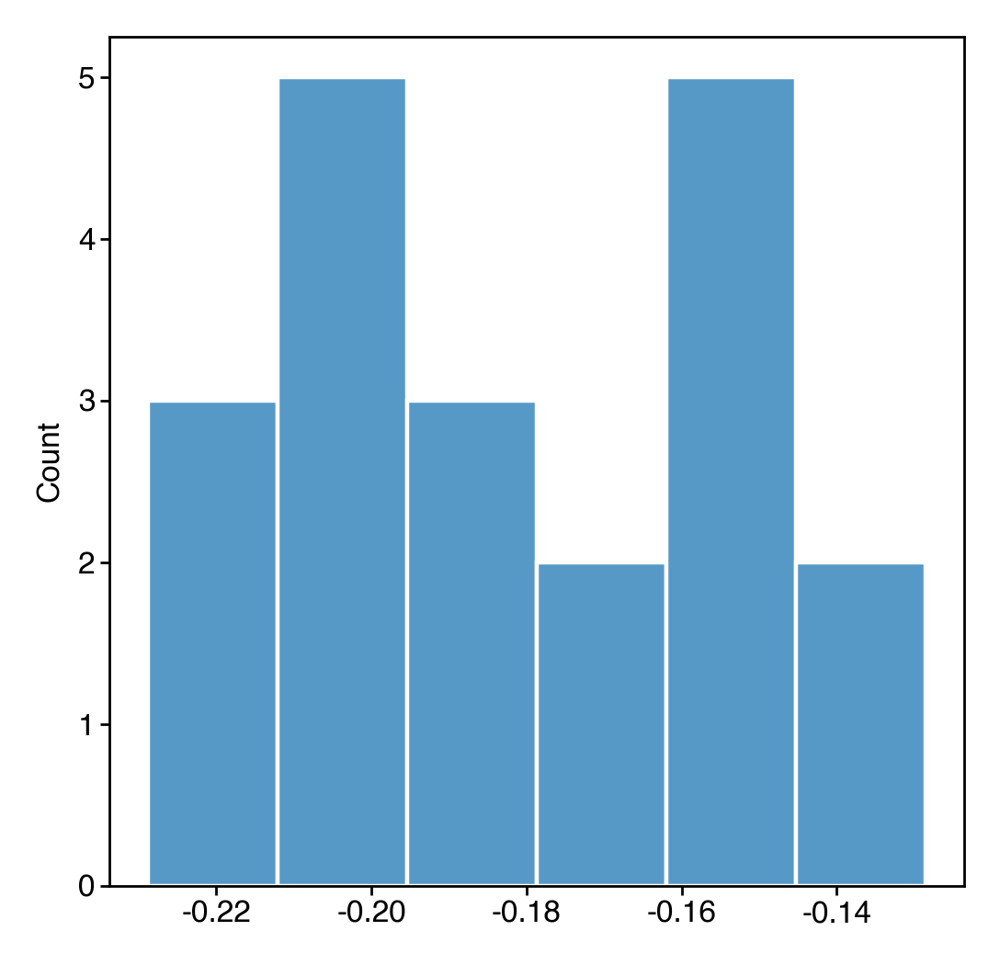

In [96]:
sns.histplot(female_heldout_r2s)

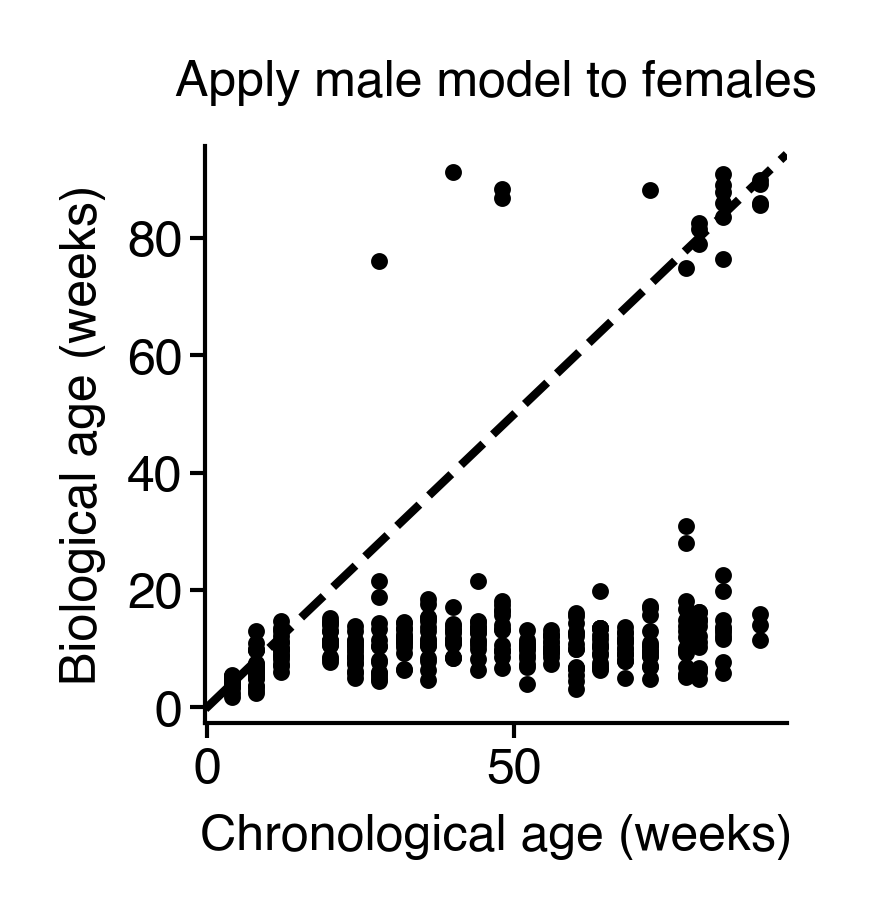

In [97]:
fig = figure(1.25, 1.25)
ax = fig.gca()
ax.scatter(female_components.age_unnormalizer(female_components.true_age), female_from_male_model['bio_ages'], s=1.5, color='k')
add_identity(ax, color='k', ls='--', zorder=-1)
ax.set(xlabel="Chronological age (weeks)", ylabel="Biological age (weeks)", title="Apply male model to females")
sns.despine()
saver(fig, "ontogeny-female-bio-age-from-male-model");

## Fit to females, apply to males

In [98]:
df, sizes_col = read_female_ontogeny(keep_syllables)

age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

In [99]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": float(optimal_age_sd),  # weeks
    "n_age_samples": 630,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [100]:
females = masked_xval(features, hypparams, 2, n_repeats=20)

  0%|          | 0/20 [00:00<?, ?it/s]

In [101]:
df, sizes_col = read_male_ontogeny(keep_syllables)

age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

In [102]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": sizes_col.to_numpy(),  # models > 1
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": float(optimal_age_sd),  # weeks
    "n_age_samples": 630,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 350,
}

In [103]:
male_components = model_setup(
    features, hypparams, 2
)

rng = np.random.RandomState(3)

male_heldout_r2s = []
for i in tqdm(females):
    female_params = females[i]['params']
    male_from_female_model = process_heldout_data(female_params, male_components, features, hypparams, model_version=2, rng=rng)
    male_heldout_r2s.append(male_from_female_model['weighted_r2'])

  0%|          | 0/20 [00:00<?, ?it/s]

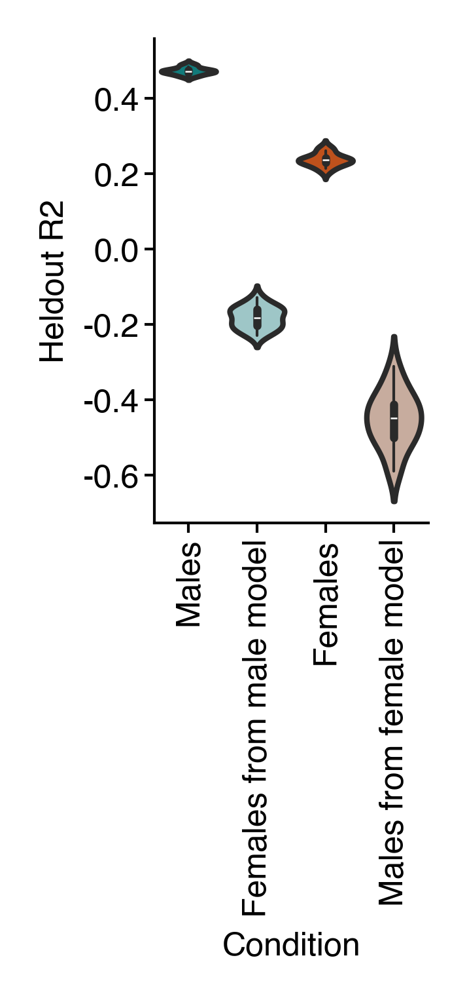

In [104]:
y = dict(
    male=list(pluck('heldout_r2_total_v3', males.values())),
    female_on_male=female_heldout_r2s,
    female=list(pluck('heldout_r2_total_v3', females.values())),
    male_on_female=male_heldout_r2s,
)

female_color = '#d94801'
male_color = '#008C8D'

fig = figure(0.9, 1.6)
ax = sns.violinplot(
    data=y,
    palette=[
        male_color,
        sns.set_hls_values(male_color, s=0.35, l=0.7),
        female_color,
        sns.set_hls_values(female_color, s=0.35, l=0.7),
    ],
    inner_kws=dict(box_width=1.5, linewidth=1),
)
ax.set(ylabel="Heldout R2", xlabel='Condition')
plt.xticks(range(4), labels=["Males", "Females from male model", "Females", "Males from female model"], rotation=90)
sns.despine()
saver(fig, 'ontogeny-male-female-heldout-r2s');

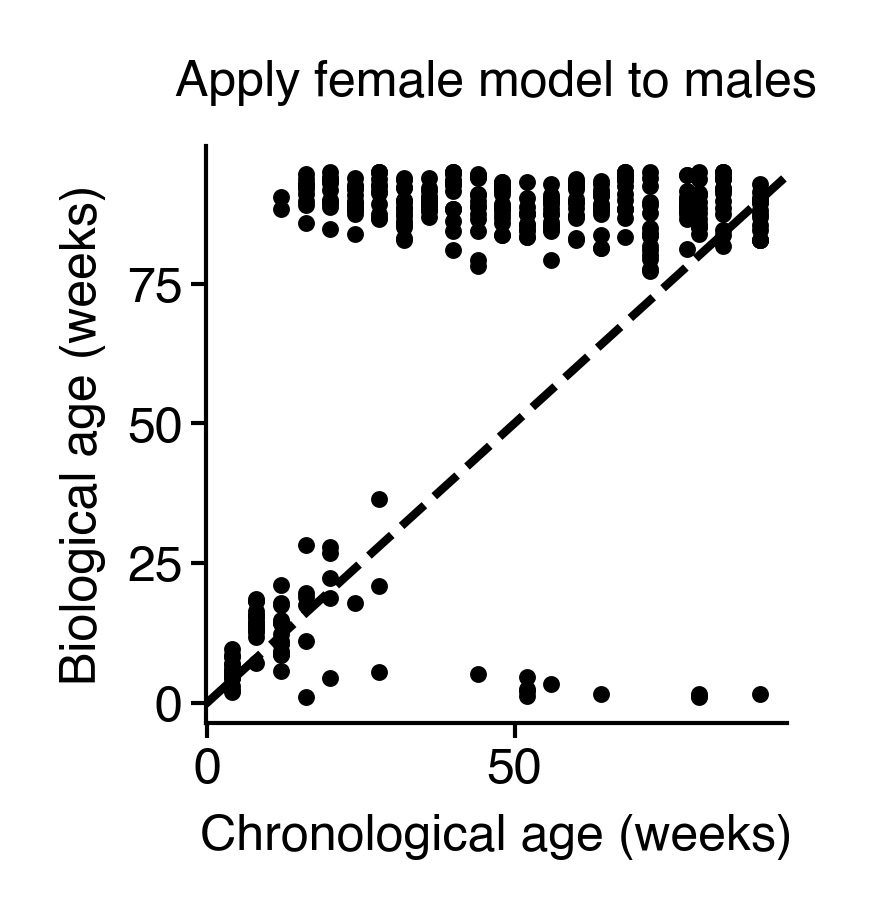

In [105]:
fig = figure(1.25, 1.25)
ax = fig.gca()
ax.scatter(male_components.age_unnormalizer(male_components.true_age), male_from_female_model['bio_ages'], s=1.5, color='k')
add_identity(ax, color='k', ls='--', zorder=-1)
ax.set(xlabel="Chronological age (weeks)", ylabel="Biological age (weeks)", title="Apply female model to males")
sns.despine()
saver(fig, "ontogeny-male-bio-age-from-female-model");

## Compare male and female fits

In [106]:
avg_total_male_counts = males[0]['counts'].sum(1).mean()
plt_age = male_components.age_unnormalizer(male_components.age_samples)

In [107]:
female_color = '#d94801'
male_color = '#008C8D'

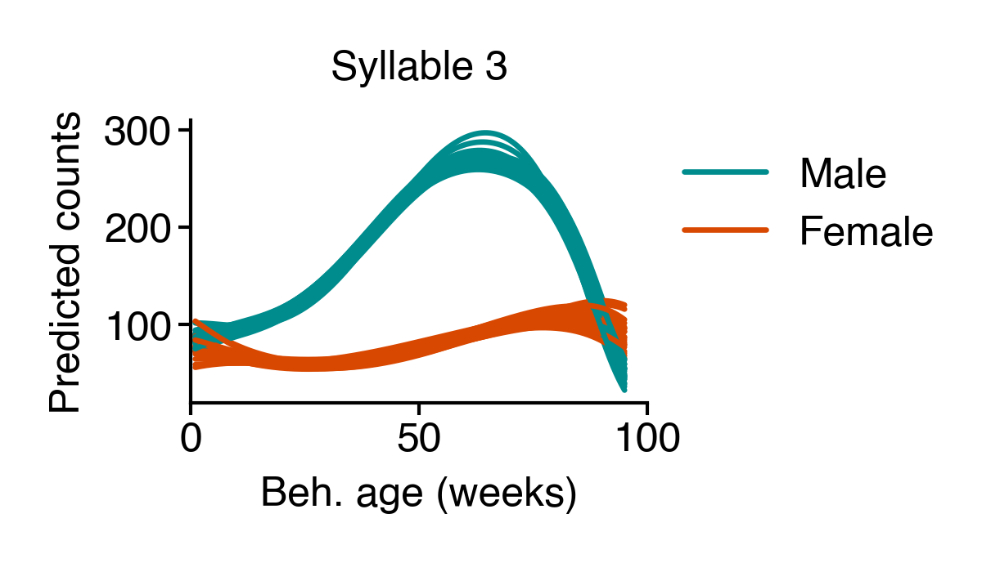

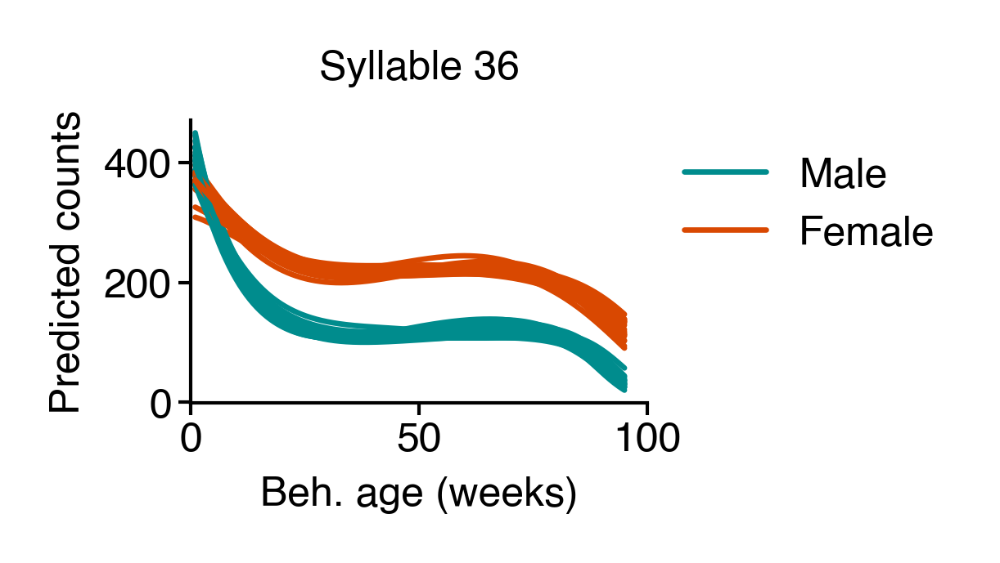

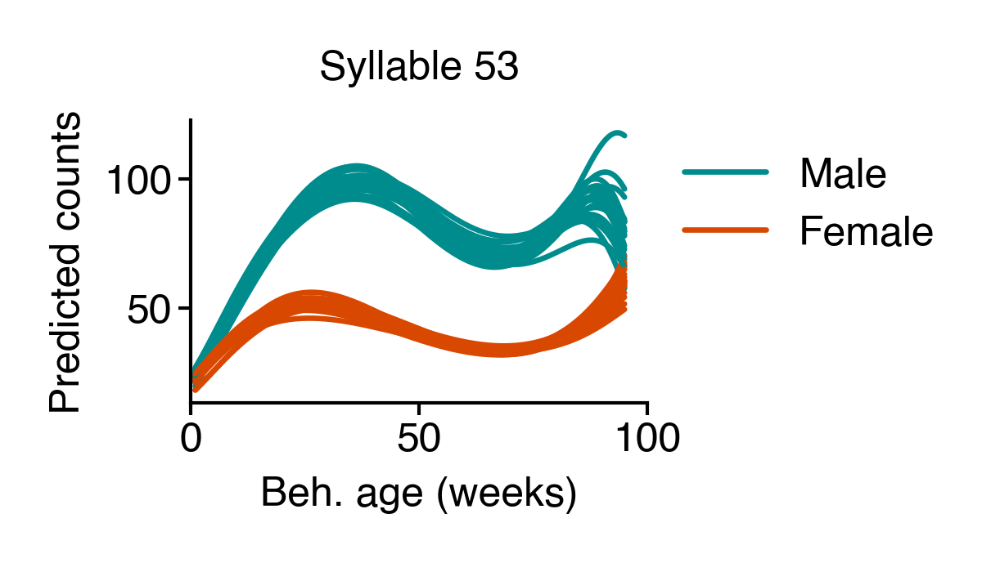

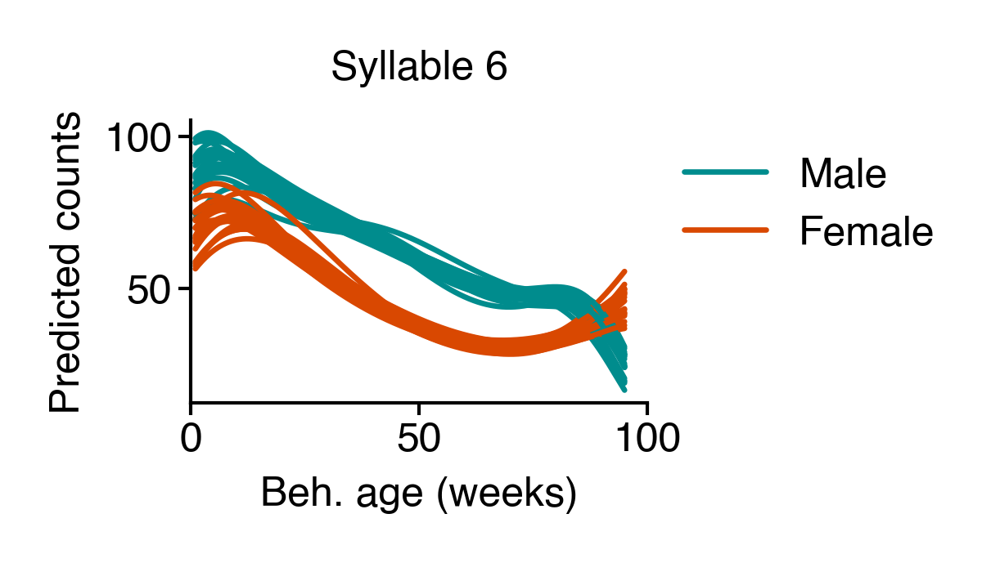

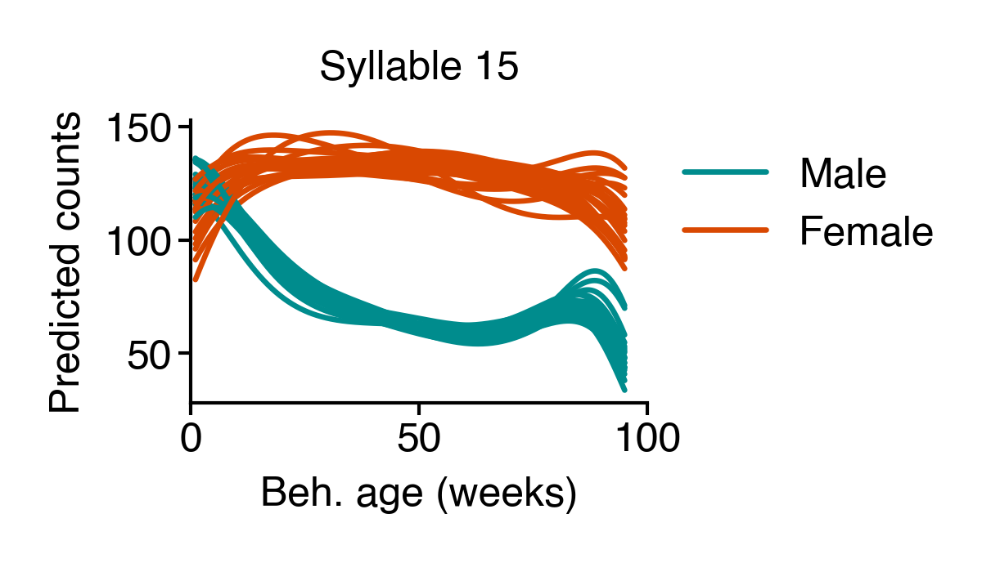

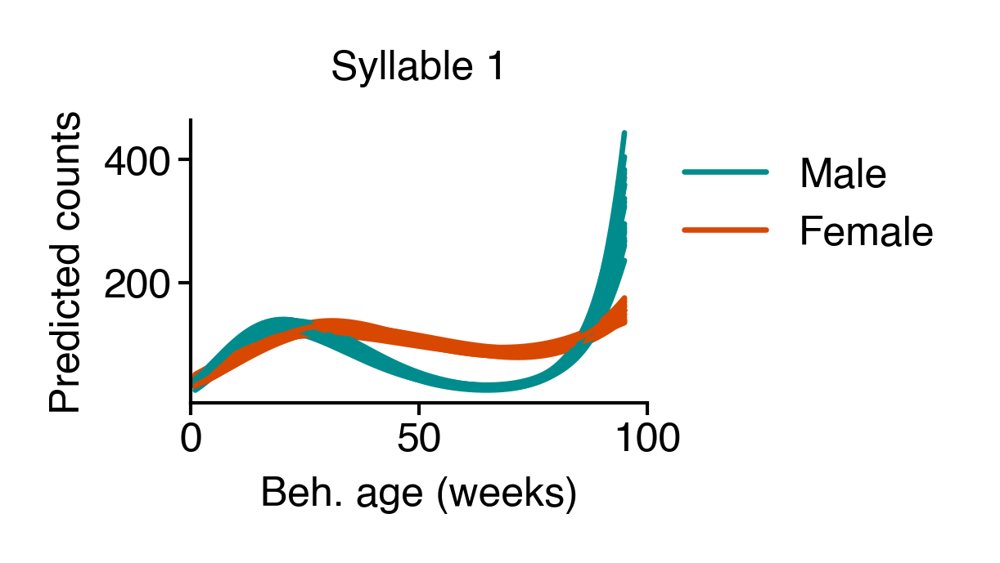

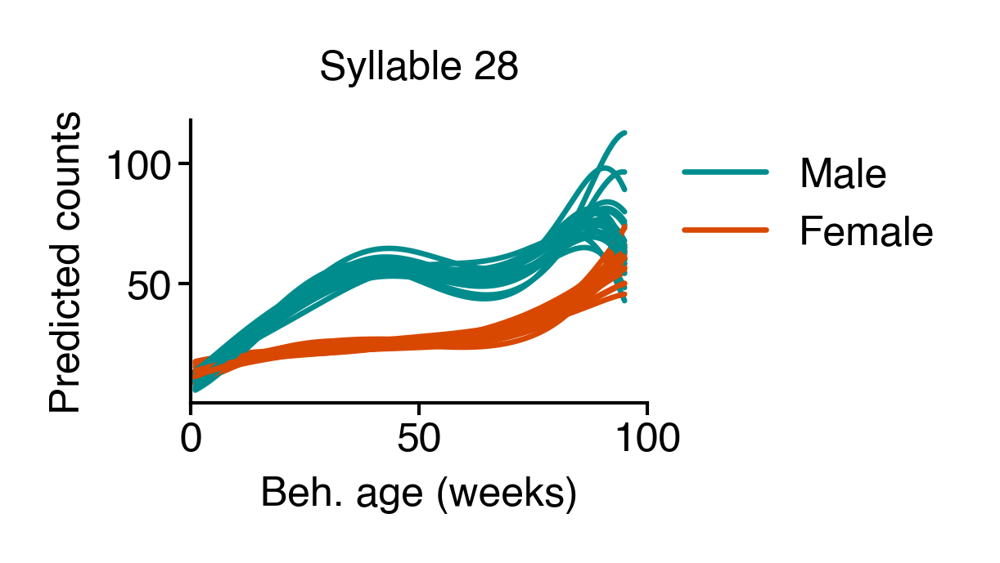

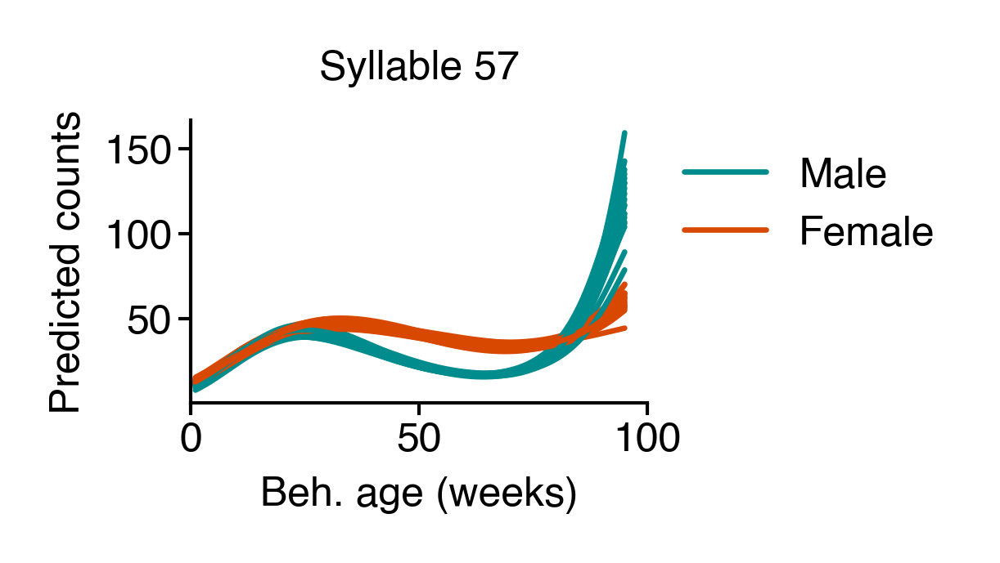

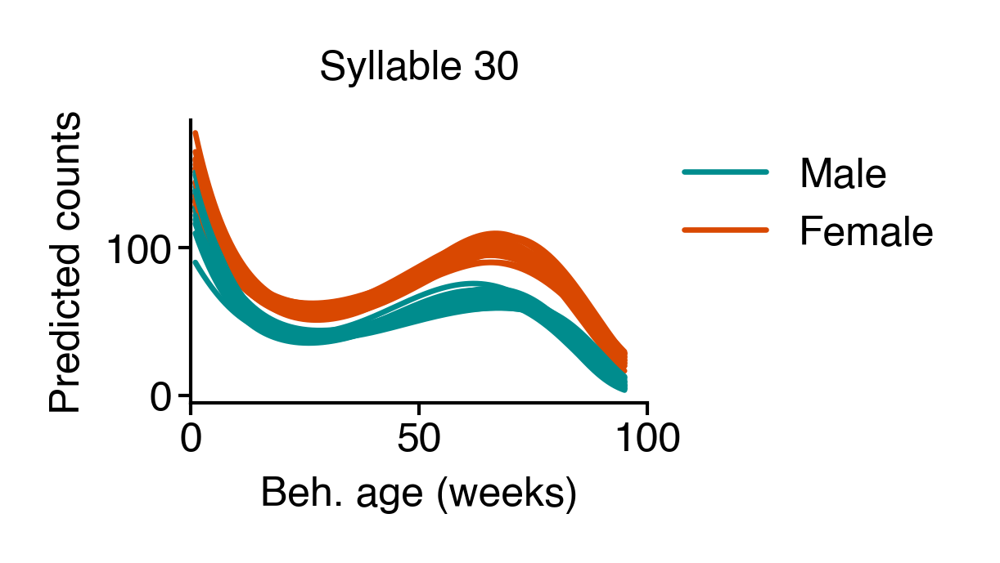

In [108]:
syllable_list = [0, 1, 4, 5, 9, 12, 14, 16, 23,]
for i, k in zip(map(lambda x: sort_idx[x], syllable_list), syllable_list):
    fig = figure(1.2, 0.75)
    ax = fig.gca()
    for j in males:
        male_conc = males[j]["concentrations"].mean(0)
        female_conc = females[j]["concentrations"].mean(0)
        male_expected_counts = expected_counts(
            male_conc, np.array([avg_total_male_counts] * len(male_conc))
        )
        female_expected_counts = expected_counts(
            female_conc, np.array([avg_total_male_counts] * len(female_conc))
        )
        ax.plot(
            plt_age,
            male_expected_counts[:, i],
            label="Male" if j == 0 else None,
            c=male_color,
            lw=0.8,
        )
        ax.plot(
            plt_age,
            female_expected_counts[:, i],
            label="Female" if j == 0 else None,
            c=female_color,
            lw=0.8,
        )
    legend()
    ax.set(
        title=f"Syllable {i}",
        xlabel="Beh. age (weeks)",
        ylabel="Predicted counts",
        xlim=(0, 100),
    )
    sns.despine()
    saver(fig, f"male-v-female-predicted-counts-syllable-{k}");

## Combine male and female data into one model

In [109]:
df, sizes_col = read_male_ontogeny(keep_syllables)
female_df, female_sizes_col = read_female_ontogeny(keep_syllables)
df = pd.concat([df, female_df])

age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))
label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
sex_id = label_encoder.fit_transform(
    np.hstack([np.zeros(len(df) - len(female_df)), np.ones(len(female_df))])[:, None]
).T

In [110]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": pd.concat([sizes_col, female_sizes_col]).to_numpy(),  # models > 1
    "mice": sex_id,
}

hypparams = {
    "min_age": 1,
    "max_age": age.max() + 5,
    "age_sd": float(optimal_age_sd),  # weeks
    "n_age_samples": 630,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(sex_id),
    "lr": 0.2,
    "n_opt_iter": 300,
}

In [111]:
combined_results = masked_xval(features, hypparams, 5, n_repeats=30)

  0%|          | 0/30 [00:00<?, ?it/s]

In [112]:
bio_age_samples = [pd.Series(v['bio_ages'], index=df.index) for v in combined_results.values()]
bio_age_samples = pd.DataFrame(bio_age_samples).T
bio_age_samples.to_parquet('/n/scratch/users/w/wg41/bio-age-model/combined-results-ontogeny-predictions.parquet')

In [113]:
combined_r2s = list(pluck('heldout_r2_total_v3', combined_results.values()))

In [114]:
# produce shuffles, compare to observed r2s
np.random.seed(0)

shuff_features = deepcopy(features)

shuff_out = {}
for i in tqdm(range(30)):
    shuff_features['mice'] = np.random.permutation(features['mice'].T).T
    shuff_results = masked_xval(shuff_features, hypparams, 5, n_repeats=1, disable_tqdm=True, seed=i)
    shuff_out[i] = shuff_results[0]

shuff_r2s = list(pluck('heldout_r2_total_v3', shuff_out.values()))

  0%|          | 0/30 [00:00<?, ?it/s]

/tmp/ipykernel_69953/1726802788.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(xticklabels=["Sex shuffle", "Observed"], ylabel="Heldout R2")


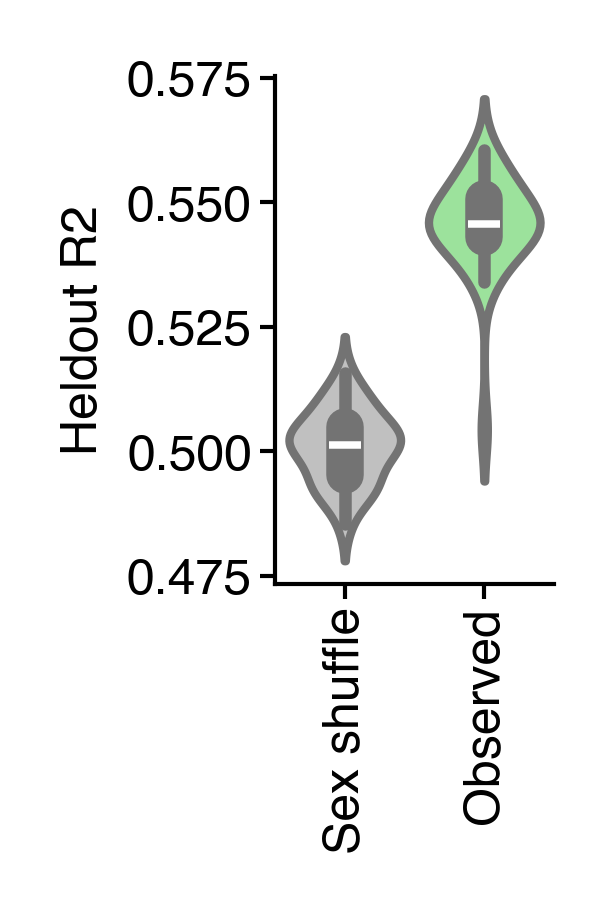

In [115]:
fig = figure(0.6, 1.1)
ax = sns.violinplot(data=[shuff_r2s, combined_r2s], palette=['silver', 'lightgreen'])
ax.set(xticklabels=["Sex shuffle", "Observed"], ylabel="Heldout R2")
plt.xticks(rotation=90)
sns.despine()
saver(fig, "combined-sex-model-performance");

### Plot model output

In [116]:
mdl = fit_model(features, hypparams, 5)

In [117]:
labels = LabelEncoder().fit_transform(np.hstack([np.zeros(len(df) - len(female_df)), np.ones(len(female_df))]))

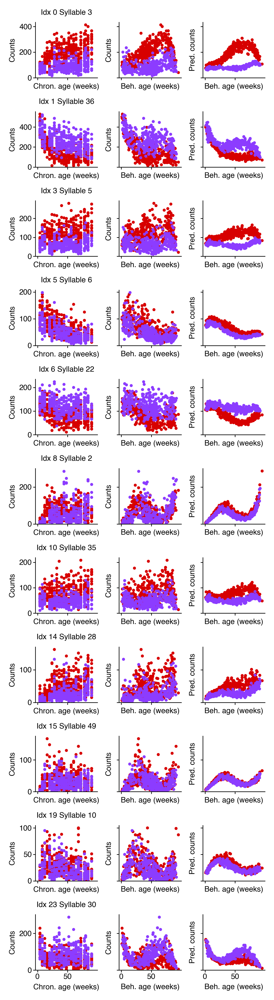

In [118]:
# male is red, female is purple
example_mice = [0, 1]

mask = []
for m in example_mice:
    mask.append(labels == m)
mask = reduce(or_, mask)

sylls = [0, 1, 3, 5, 6, 8, 10, 14, 15, 19, 23]
fig, ax = plt.subplots(len(sylls), 3, figsize=(3, len(sylls)), sharex=True)

true_age = mdl["true_ages"][mask]
bio_age = mdl["bio_ages"][mask]
counts = mdl["counts"][mask]
pred_counts = mdl["predicted_counts"][mask]

for a, syll, i in zip(ax, map(lambda i: sort_idx[i], sylls), sylls):
    max_counts = max([counts[:, syll].max(), pred_counts[:, syll].max()]) * 1.05
    a[0].scatter(true_age, counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[0].set(title=f"Idx {i} Syllable {syll}", ylabel="Counts", xlabel="Chron. age (weeks)", ylim=(0, max_counts))

    a[2].scatter(bio_age, pred_counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[2].set(ylabel="Pred. counts", xlabel="Beh. age (weeks)", ylim=(0, max_counts), yticklabels=[])

    a[1].scatter(bio_age, counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0)
    a[1].set(ylabel="Counts", xlabel="Beh. age (weeks)", ylim=(0, max_counts), yticklabels=[])

sns.despine()
fig.tight_layout()

saver(fig, "sex-ontogeny-true-vs-predicted-counts");

In [119]:
list(mdl['params'])

['bio_basis_weights', 'development_weights', 'individual_biases', 'size_slope']

In [120]:
x = mdl['params']['development_weights']
dev = (x @ mdl['init_components'].bases['development']).squeeze()

In [121]:
comps = mdl['init_components']

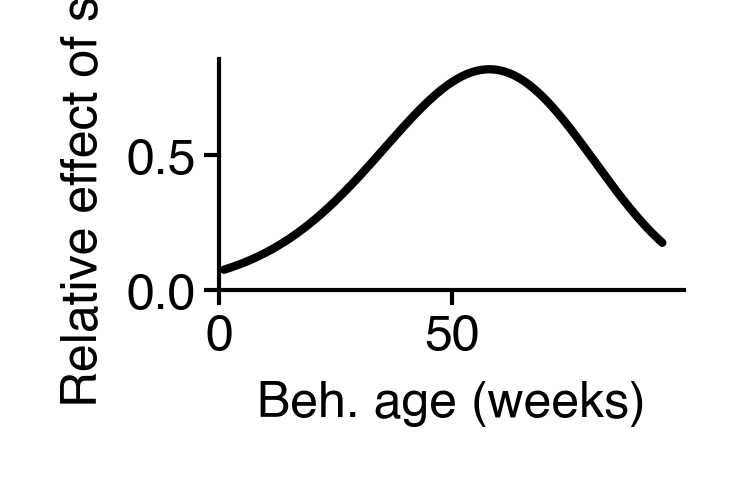

In [122]:
dev = np.exp(dev)

fig = figure(1, 0.5)
plt.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, None)
plt.ylim(0, None)
plt.xlabel("Beh. age (weeks)")
plt.ylabel("Relative effect of sex")
sns.despine()
saver(fig, "ontogeny-effect-of-sex");

## Make ontogeny sex age plot

In [123]:
def make_plot(age_df, width, height, hue_order=None):
    boundaries = np.arange(age_df["labels"].max() + 2) - 0.5
    fig = figure(width, height)
    if hue_order is None:
        pal = cc.glasbey[: age_df["labels"].max() + 1]
    else:
        pal = [cc.glasbey[hue] for hue in hue_order]
    ax = sns.lineplot(
        data=age_df,
        x="true_ages",
        y="bio_ages",
        hue="labels",
        palette=pal,
        hue_order=hue_order,
        legend=False,
        zorder=-1,
        lw=0.25,
    )
    if hue_order is not None:
        age_df = age_df[age_df['labels'].isin(hue_order)]
    im = ax.scatter(
        age_df["true_ages"],
        age_df["bio_ages"],
        c=age_df["labels"],
        cmap=cc.cm.glasbey,
        vmin=0,
        vmax=256,
        s=2.5,
    )
    cb = fig.colorbar(
        mappable=im,
        boundaries=boundaries,
        ax=ax,
        label="Sex",
    )
    cb.set_ticks(range(0, 2))
    cb.set_ticklabels(["Male", "Female"])
    add_identity(ax, c="k", ls="--", zorder=-2)
    ax.set(
        xlabel="Chronological age (weeks)",
        ylabel="Behavioral age (weeks)",
        aspect="equal",
        # ylim=(0, 72),
        # xlim=(0, 72),
    )
    sns.despine()
    return fig

In [124]:
age_df = pd.DataFrame(
    dict(bio_ages=mdl["bio_ages"], true_ages=mdl["true_ages"], labels=labels),
)

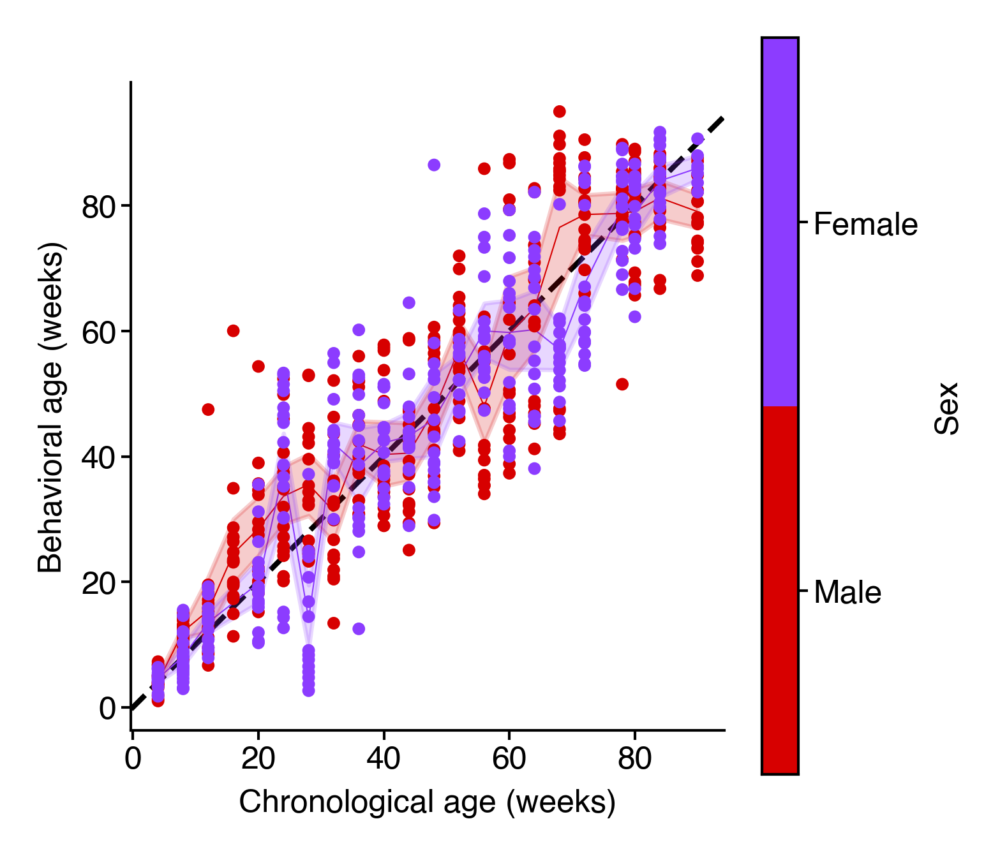

In [125]:
fig = make_plot(age_df, 2.5, 2.5)
saver(fig, "ontogeny-sex-chron-vs-beh-age-all-timepoints");